In [1]:
import pandas as pd
import matplotlib.pyplot as plt
file = 'G:/Mon Drive/PCO/data/'

dtypes = {
    'CRO': str,
    'id_diag': float,
    'id_med': float,
    'nir': str,
    'source':str,
    'operation':str
}

# Chargement des données

## chargement des CRO

In [2]:
# chargement des CRO générés avec deux modèles différents
CRO = pd.read_csv(f'{file}\CRO_df.csv', sep=';', dtype=dtypes)
print('nb de CRO total:', len(CRO))

nb de CRO total: 3097


In [3]:
lignes_manquantes = CRO[CRO.isna().any(axis=1)]
print(lignes_manquantes)

      CRO  id_diag  id_med                     nir  \
113   NaN      1.0    53.0  2 1961 11 83373 162 79   
165   NaN     18.0     2.0  1 1960 11 65552 524 96   
167   NaN      5.0    57.0  1 1993 07 46329 513 71   
180   NaN     19.0     7.0  2 1957 08 97189 959 54   
319   NaN     20.0     4.0  2 1980 10 97375 990 10   
511   NaN     10.0    58.0  1 1948 06 65501 880 61   
561   NaN      5.0    53.0  1 1960 11 65552 524 96   
601   NaN      4.0    55.0  2 1961 11 83373 162 79   
781   NaN      9.0     4.0  2 1960 04 56399 501 68   
881   NaN     11.0     3.0  2 2001 07 87283 983 57   
984   NaN      8.0     5.0  1 1998 03 74510 756 57   
1143  NaN      2.0    50.0  2 1935 08 30194 424 27   
1309  NaN     17.0     5.0  1 1963 01 21813 466 38   
1382  NaN     20.0     0.0  1 1993 07 46329 513 71   
1456  NaN     10.0    58.0  2 1957 08 97189 959 54   
1496  NaN     10.0    58.0  2 1960 04 56399 501 68   
1678  NaN      4.0    56.0  2 1981 08 17268 040 85   
1679  NaN      8.0     0.0  

In [4]:
CRO = CRO.dropna()
print('nb de CRO total après supp des lignes nan:', len(CRO))
CRO.id_diag = CRO.id_diag.round(0).astype(int)
CRO.id_med = CRO.id_med.round(0).astype(int)

nb de CRO total après supp des lignes nan: 3071


In [5]:
CRO.head(5)

,CRO,id_diag,id_med,nir,source,operation
0,Résumé anatomo-pathologique\nPatient : Thomas ...,5,59,1 1980 08 14995 716 37,mistralai/Mistral-7B-Instruct-v0.2,biopsie
1,Résumé anatomopathologique\nPatient : Susan Ré...,20,8,2 1980 10 97375 990 10,mistralai/Mistral-7B-Instruct-v0.2,biopsie
2,Résumé anatomo-pathologique\nPatient : M Bertr...,12,4,1 1980 01 38964 514 29,mistralai/Mistral-7B-Instruct-v0.2,biopsie
3,Résumé anatomopathologique\nPatient : Mme Virg...,4,1,2 1935 08 30194 424 27,mistralai/Mistral-7B-Instruct-v0.2,biopsie
4,Résumé anatomopathologique\nPatient : M Benjam...,6,55,1 1948 12 72655 239 21,mistralai/Mistral-7B-Instruct-v0.2,biopsie


## chargements des données annexes (patients, anatomopathologistes, diagnostics)

In [6]:
# chargement des data de patients, anatomopathologistes, diagnostics
dtypes_patients = {
    'name':str,
    'address':str,
    'birthday': str,
    'nir':str
}

dtypes_meds = {
    'name':str,
    'id_med':int
}

dtypes_diag = {
    'organe': str,
    'diagnostic':str,
    'cancer': str,
    'id_diag':int
}

patients = pd.read_csv(f'{file}patients.csv', sep=';', dtype = dtypes_patients)
meds = pd.read_csv(f'{file}anatomopathologists.csv', sep=';', dtype = dtypes_meds)
diagnostics = pd.read_csv(f'{file}diagnostics.csv', sep=';', dtype = dtypes_diag)

In [7]:
patients.head(5)

,name,address,birthday,nir
0,Gilbert Étienne,"49, boulevard de Jacques, 21813 Legendre",15/01/1963,1 1963 01 21813 466 38
1,Joseph Berthelot,"avenue Georges David, 65552 Saint Simone",04/11/1960,1 1960 11 65552 524 96
2,Guillaume Samson,"611, boulevard Rey, 65501 Saint AnneVille",19/06/1948,1 1948 06 65501 880 61
3,Alexandre Clément,"3, boulevard Simon, 74510 Devaux",17/03/1998,1 1998 03 74510 756 57
4,Étienne Techer,"avenue de Munoz, 46329 Giraud",26/07/1993,1 1993 07 46329 513 71


In [8]:
meds.head(5)

,name,id_med
0,Dr Zacharie Mercier,0
1,Dr Olivier Bernier,1
2,Dr Antoine Brunet,2
3,Dr Luc Hamel,3
4,Dr Frédéric Martel,4


In [9]:
diagnostics.head(5)

,organe,diagnostic,cancer,id_diag
0,peau,psoriasis,0,1
1,peau,mélanome,1,2
2,peau,rosacée,0,3
3,peau,lupus érythémateux,0,4
4,peau,lichen plan,0,5


In [10]:
# merge des datas avec les CRO
merge_CRO_patients = pd.merge(CRO, patients, on='nir', how='left')
merge_CRO_meds = pd.merge(merge_CRO_patients, meds, on='id_med', how='left')
merge_CRO_diagnostics = pd.merge(merge_CRO_meds, diagnostics, on='id_diag', how='left')

In [11]:
# vérification que la taille du dataframe de CRO ne changent pas (signe de doublon)
print('taille merge CRO partients', len(merge_CRO_patients))
print('taille merge CRO anatomopathologistes', len(merge_CRO_meds))
print('taille merge CRO diagnoctics', len(merge_CRO_diagnostics))

taille merge CRO partients 3071
taille merge CRO anatomopathologistes 3071
taille merge CRO diagnoctics 3071


In [12]:
df_CRO_all = merge_CRO_diagnostics.copy()
df_CRO_all = df_CRO_all.rename(columns={"name_x": 'name_patient', "name_y": "name_med"})
df_CRO_all.head(5)

,CRO,id_diag,id_med,nir,source,operation,name_patient,address,birthday,name_med,organe,diagnostic,cancer
0,Résumé anatomo-pathologique\nPatient : Thomas ...,5,59,1 1980 08 14995 716 37,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Thomas Lemaire,"53, boulevard Auguste Lefèvre, 14995 Marty-la-...",31/08/1980,Dr Alice Brunet,peau,lichen plan,0
1,Résumé anatomopathologique\nPatient : Susan Ré...,20,8,2 1980 10 97375 990 10,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Susan Rémy,"rue Louis Colin, 97375 Texier-sur-Delmas",23/10/1980,Dr Antoine Jacquet,côlon,polypose adénomateuse familiale,1
2,Résumé anatomo-pathologique\nPatient : M Bertr...,12,4,1 1980 01 38964 514 29,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Bertrand Lemoine,"96, rue Honoré Hoareau, 38964 Delmas",10/01/1980,Dr Frédéric Martel,côlon,adénocarcinome,1
3,Résumé anatomopathologique\nPatient : Mme Virg...,4,1,2 1935 08 30194 424 27,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Virginie Gonzalez,"boulevard Nicole Marty, 30194 Saint Élisabethdan",27/08/1935,Dr Olivier Bernier,peau,lupus érythémateux,0
4,Résumé anatomopathologique\nPatient : M Benjam...,6,55,1 1948 12 72655 239 21,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Benjamin Vaillant,"65, avenue de Barre, 72655 Sainte Dominique",01/12/1948,Dr Chantal Laurent,peau,carcinome basocellulaire,1


# EDA

In [13]:
df_CRO = df_CRO_all.query('organe != "foie"')

## Répartition entre les sources

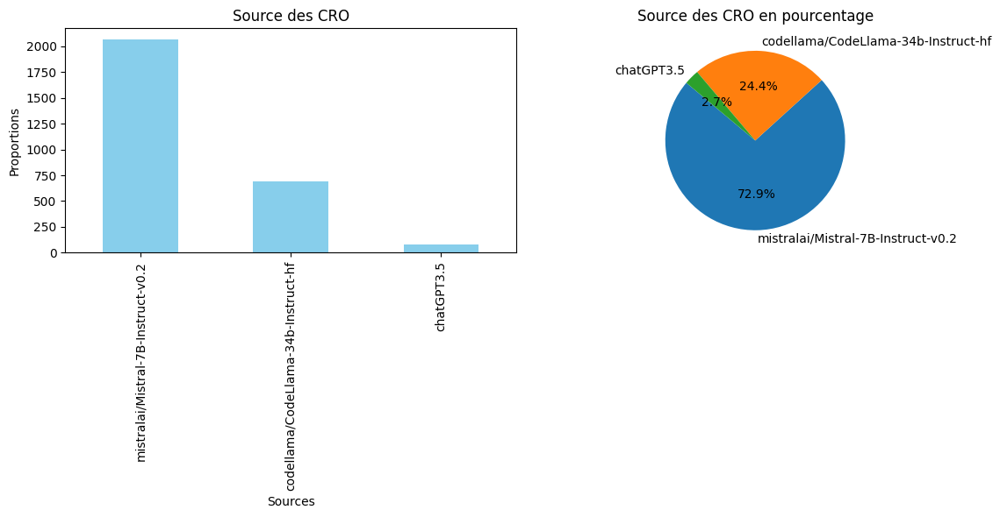

In [14]:
# Comptez les occurrences de chaque valeur dans la colonne
value_counts_source = df_CRO['source'].value_counts()

# Créez un camembert
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
plt.pie(value_counts_source, labels=value_counts_source.index, autopct='%1.1f%%', startangle=140)
plt.title('Source des CRO en pourcentage')

# Créez un graphique en barres
plt.subplot(1, 2, 1)
value_counts_source.plot(kind='bar', color='skyblue')
plt.title('Source des CRO')
plt.xlabel('Sources')
plt.ylabel('Proportions')

plt.tight_layout()

Pour que le modèle Spacy puisse être entrainé, une occurence doit impérativement apparaitre au moins une fois dans le dataframe réservé à  l'entrainemenet et dans celui réservé à la validation. Cela est vraie pour toutes les valeurs appartenant aux différents labels d'entité nommée.

## Nb d'occurence anatomopathologiste

In [15]:
print("nb d'anatomopathogiste en référénce:", 20)
nb_meds = df_CRO.id_med.unique()
print("nb d'anatomopathologiste qui apparaissent dans les CRO:", len(nb_meds))

nb d'anatomopathogiste en référénce: 20
nb d'anatomopathologiste qui apparaissent dans les CRO: 48


Text(0, 0.5, 'Occurence')

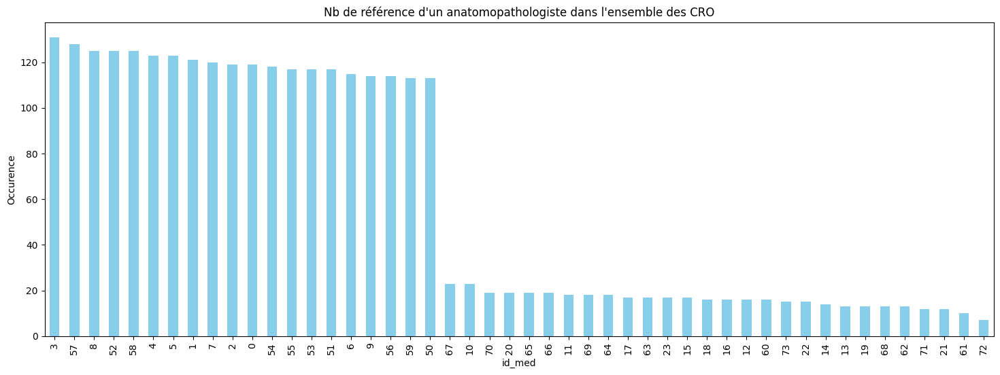

In [16]:
value_counts_med = df_CRO['id_med'].value_counts()

plt.figure(figsize=(18, 6))
value_counts_med.plot(kind='bar', color='skyblue')
plt.title("Nb de référence d'un anatomopathologiste dans l'ensemble des CRO")
plt.xlabel('id_med')
plt.ylabel('Occurence')

## Nb d'occurence d'un patient

In [17]:
print("nb de patient en référénce:", 20)
nb_patients = df_CRO.nir.unique()
print("nb de patient qui apparaissent dans les CRO:", len(nb_patients))

nb de patient en référénce: 20
nb de patient qui apparaissent dans les CRO: 48


Text(0, 0.5, 'Occurence')

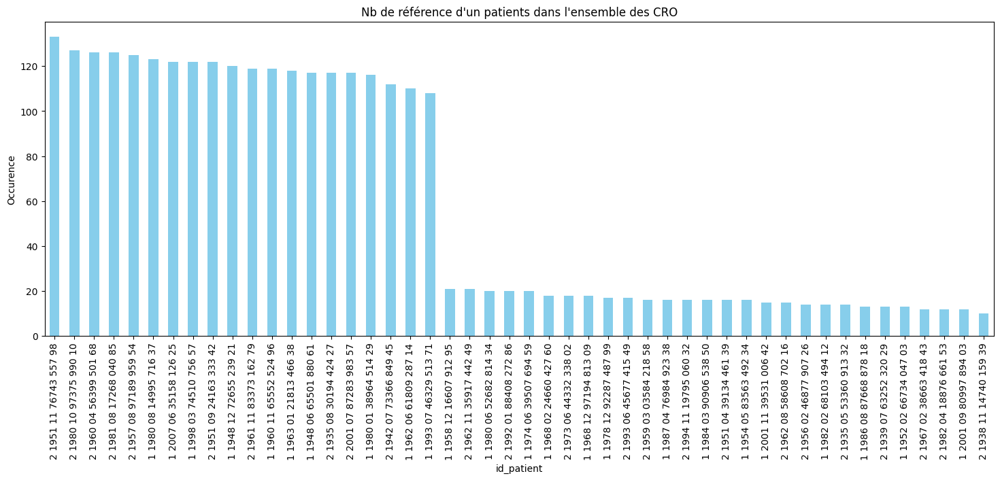

In [18]:
value_counts_patients = df_CRO['nir'].value_counts()

plt.figure(figsize=(18, 6))
value_counts_patients.plot(kind='bar', color='skyblue')
plt.title("Nb de référence d'un patients dans l'ensemble des CRO")
plt.xlabel('id_patient')
plt.ylabel('Occurence')

## Répartition par organe

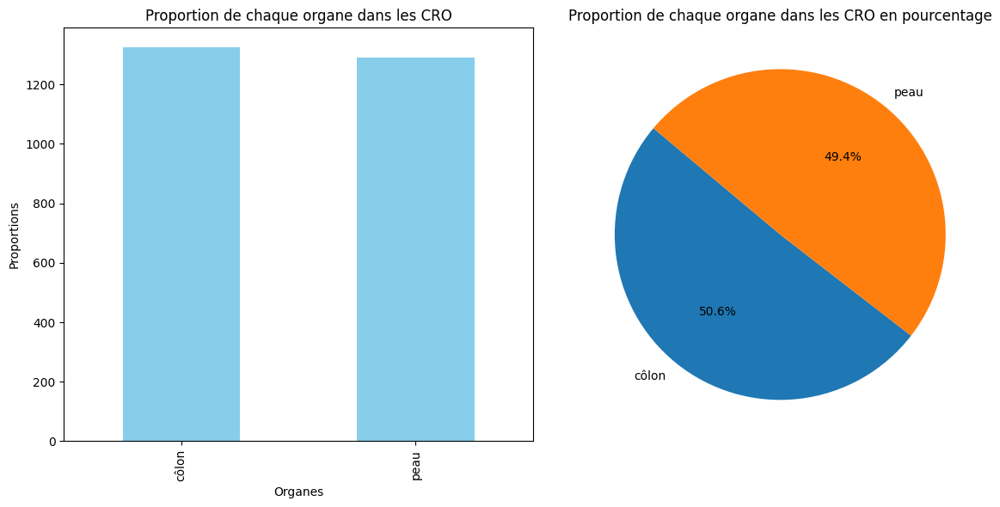

In [19]:
# Comptez les occurrences de chaque valeur dans la colonne
value_counts_org = df_CRO['organe'].value_counts()

# Créez un camembert
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
plt.pie(value_counts_org, labels=value_counts_org.index, autopct='%1.1f%%', startangle=140)
plt.title('Proportion de chaque organe dans les CRO en pourcentage')

# Créez un graphique en barres
plt.subplot(1, 2, 1)
value_counts_org.plot(kind='bar', color='skyblue')
plt.title('Proportion de chaque organe dans les CRO')
plt.xlabel('Organes')
plt.ylabel('Proportions')

plt.tight_layout()

## Répartition des diagnostics

In [20]:
diags_train_valid = diagnostics.query('organe != "foie"')
print("nb de diagnostics en référence:", len(diags_train_valid))
nb_diags = df_CRO.id_diag.unique()
print("nb de diagnostics qui apparaissent dans les CRO:", len(nb_diags))

nb de diagnostics en référence: 20
nb de diagnostics qui apparaissent dans les CRO: 28


Text(0, 0.5, 'Occurence')

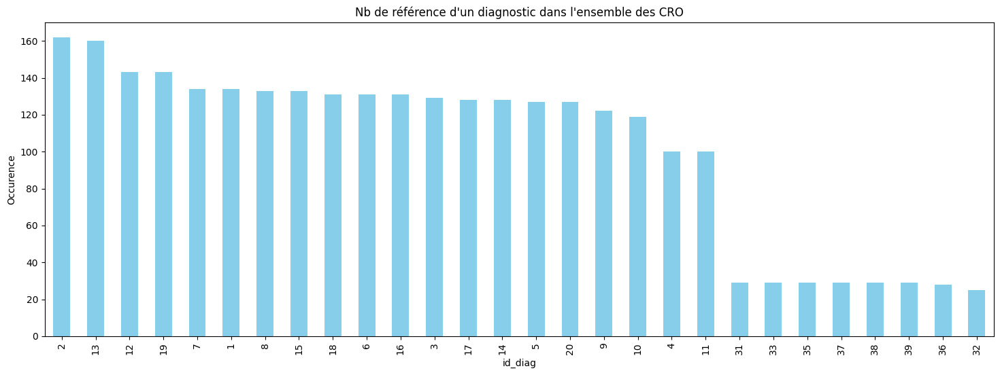

In [21]:
value_counts_diag = df_CRO['id_diag'].value_counts()

plt.figure(figsize=(18, 6))
value_counts_diag.plot(kind='bar', color='skyblue')
plt.title("Nb de référence d'un diagnostic dans l'ensemble des CRO")
plt.xlabel('id_diag')
plt.ylabel('Occurence')

# Langue et Qualité

## Langue

Lors des expérimentations sur les modèles de huggingchat, et par expérience avec chatGPT, il arrivait que la langue de rédaction change, pour passer subitement à l'anglais. Il fallait conserver que les CRO en français, puisque le diagnostic ne serait pas retrouvé.

In [22]:
from langdetect import detect_langs

def detect_language_proportion(text: str) -> str:
    """
    renvoie les langues détectées avec le pourcentage de confiance
    """
    try:
        lang_proportions = detect_langs(text)
        response = []
        results = {lang.lang: lang.prob for lang in lang_proportions}
        for lang, proportion in results.items():
            response.append(f"{lang}, {round(proportion, 2)}")
        response = '/'.join(response)
        return response
    except:
        return 'pas de langue détectée'

In [23]:
df_CRO_lang = df_CRO.copy(deep=True)

df_CRO_lang['language_proportions'] = df_CRO_lang.CRO.apply(detect_language_proportion)

In [24]:
df_CRO_lang.head(5)

,CRO,id_diag,id_med,nir,source,operation,name_patient,address,birthday,name_med,organe,diagnostic,cancer,language_proportions
0,Résumé anatomo-pathologique\nPatient : Thomas ...,5,59,1 1980 08 14995 716 37,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Thomas Lemaire,"53, boulevard Auguste Lefèvre, 14995 Marty-la-...",31/08/1980,Dr Alice Brunet,peau,lichen plan,0,"fr, 1.0"
1,Résumé anatomopathologique\nPatient : Susan Ré...,20,8,2 1980 10 97375 990 10,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Susan Rémy,"rue Louis Colin, 97375 Texier-sur-Delmas",23/10/1980,Dr Antoine Jacquet,côlon,polypose adénomateuse familiale,1,"fr, 1.0"
2,Résumé anatomo-pathologique\nPatient : M Bertr...,12,4,1 1980 01 38964 514 29,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Bertrand Lemoine,"96, rue Honoré Hoareau, 38964 Delmas",10/01/1980,Dr Frédéric Martel,côlon,adénocarcinome,1,"fr, 1.0"
3,Résumé anatomopathologique\nPatient : Mme Virg...,4,1,2 1935 08 30194 424 27,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Virginie Gonzalez,"boulevard Nicole Marty, 30194 Saint Élisabethdan",27/08/1935,Dr Olivier Bernier,peau,lupus érythémateux,0,"fr, 1.0"
4,Résumé anatomopathologique\nPatient : M Benjam...,6,55,1 1948 12 72655 239 21,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Benjamin Vaillant,"65, avenue de Barre, 72655 Sainte Dominique",01/12/1948,Dr Chantal Laurent,peau,carcinome basocellulaire,1,"fr, 1.0"


In [25]:
nb_CRO_en = len(df_CRO_lang.query('language_proportions != "fr, 1.0"'))
print('nb de CRO dans une autre langue (complet ou partiel):', nb_CRO_en, 'soit', round(nb_CRO_en * 100 / len(df_CRO)), '% des CRO générés.')

nb de CRO dans une autre langue (complet ou partiel): 242 soit 9 % des CRO générés.


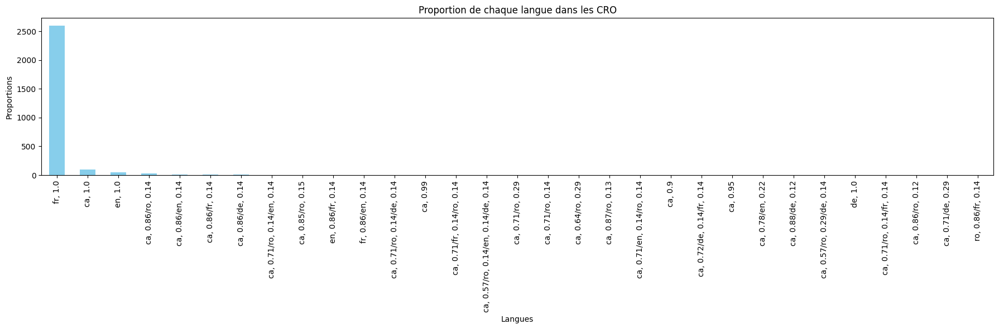

In [26]:
# Comptez les occurrences de chaque valeur dans la colonne
value_counts_lang = df_CRO_lang['language_proportions'].value_counts()

plt.figure(figsize=(18, 6))

# Créez un graphique en barres
value_counts_lang.plot(kind='bar', color='skyblue')
plt.title('Proportion de chaque langue dans les CRO')
plt.xlabel('Langues')
plt.ylabel('Proportions')

plt.tight_layout()

In [27]:
CRO_non_fr = df_CRO_lang.query('language_proportions != "fr, 1.0"').reset_index()
for index in range(0, len(CRO_non_fr)):
    print(CRO_non_fr.CRO[index], '\n')

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Title: Operative Report of Histopathological Examination
Date: __________
Patient Information:
Full Name: _______________________
Age: __________
Sex: __________
Medical Record Number: __________
Procedure Details:
Hist

Au vu de la faible quantité de CRO réellement en anglais, les autres sont les CRO non terminés, il n'est pas intéressant de tenter de les récupérer. D'autant plus qu'une autre problème peut se poser, le diagnostic peut se retrouver avec une dénomination différente que celle initialement prévue.

## Qualité

### Nb de mots dans les CRO

Parfois, chatGPT peut se montrer 'faignant' et ne générer que le stric minimum sans le moindre phrase. Pour ne prendre que les CRO dont les diagnostics se trouvent au sein d'une phrase, le nombre de mots est analysé.

In [28]:
def nb_word_in_text(texte: str) -> int:
    try:
        texte_list = texte.split()
        nb_word = len(texte_list)
        return nb_word
    except:
        return 0

In [29]:
df_CRO_lang['nb_word'] = df_CRO_lang.CRO.apply(nb_word_in_text) 

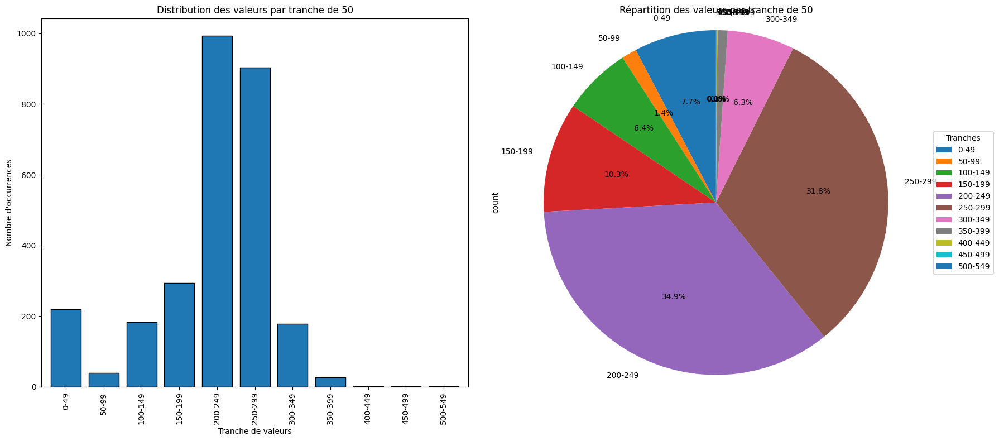

In [30]:
tranche = 50

# Créer des tranches
tranches = [(i, i + tranche - 1) for i in range(0, df_CRO_lang['nb_word'].max(), tranche)]

# Création de la colonne de tranche en utilisant la fonction pd.cut
df_CRO_lang['tranche'] = pd.cut(df_CRO_lang['nb_word'], bins=[i[0] for i in tranches] + [df_CRO_lang['nb_word'].max()], labels=[f"{i[0]}-{i[1]}" for i in tranches])

# Comptage du nombre d'occurrences dans chaque tranche
value_counts_tranches = df_CRO_lang['tranche'].value_counts(sort=False).sort_index()

# Création de la figure et des sous-graphiques
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(18, 8))

# Graphique à barres
value_counts_tranches[value_counts_tranches != 0].plot(kind='bar', edgecolor='black', width=0.8, ax=ax1)
ax1.set_xlabel('Tranche de valeurs')
ax1.set_ylabel('Nombre d\'occurrences')
ax1.set_title(f'Distribution des valeurs par tranche de {tranche}')

# Graphique camembert
value_counts_tranches[value_counts_tranches != 0].plot(kind='pie', autopct='%1.1f%%', startangle=90, ax=ax2)
ax2.axis('equal')  # Assure un camembert circulaire
ax2.set_title(f'Répartition des valeurs par tranche de {tranche}')
ax2.legend(value_counts_tranches[value_counts_tranches != 0].index, title='Tranches', loc='center left', bbox_to_anchor=(1, 0.5))

# Ajustements de la mise en page
plt.tight_layout()

In [31]:
CRO_tranche_query = df_CRO_lang.query('tranche == "800-849"').reset_index()
for index in range(0, len(CRO_tranche_query)):
    print(CRO_tranche_query.CRO[index], '\n')

Les CRO compris entre 0 et 49 mots sont tous ceux qui ne sont pas terminés. Lors de la sélection des CRO en fonction du paramètre de la présence de la note de fin, ces CRO ne seront pas pris en compte. <br>
Les CRO compris entre 50 et 99 mots possèdent une partie des CRO non terminés. Les autres, dans la majorité des cas possèdent une phrase de conclusion possédant le diagnostic, et pas simplement un 'conclusion: diagnostic'.<br>
Le CRO entre 850 et 899 mots, ce dernier ne possèdent pas la note de fin. Il ne fait que répéter des anticorps d'immunohistochimie.<br>
Il n'y a aucun CRO compris entre 400 et 849 mots.

## CRO avec la note de fin 'Ceci est compte-rendu fictif'

Lors des essais de génération de CRO, il est apparu que certain CRO ne se terminait pas. Il s'est alors posé la question de savoir comment déterminer si un CRO était terminé. Pour régler cela, vu dans certain CRO, une note de fin doit apparaitre spécifiant que le compte rendu était fictif.

In [32]:
def CRO_note_valid(CRO: str) -> int:
    response = 0
    CRO_lower = CRO.lower()
    note_list = ['ceci est un compte rendu fictif', 
                 'ceci est un compte-rendu fictif', 
                 'ce compte rendu est fictif',             
                 'ce document est un compte rendu fictif',
                 'ce document est un compte-rendu fictif',
                 'ce document est un compte rendu opératoire fictif',
                 'ce rapport est fictionnel',
                 'ce rapport opératoire est fictif',
                 'ce rapport est fictif', 
                 'ce résumé est fictif',
                 'cette note est un compte rendu fictif',]
    for note in note_list:
        if note in CRO_lower:
            response = 1
            break
    return response


In [33]:
df_CRO_lang['note_fin'] = df_CRO_lang.CRO.apply(CRO_note_valid)

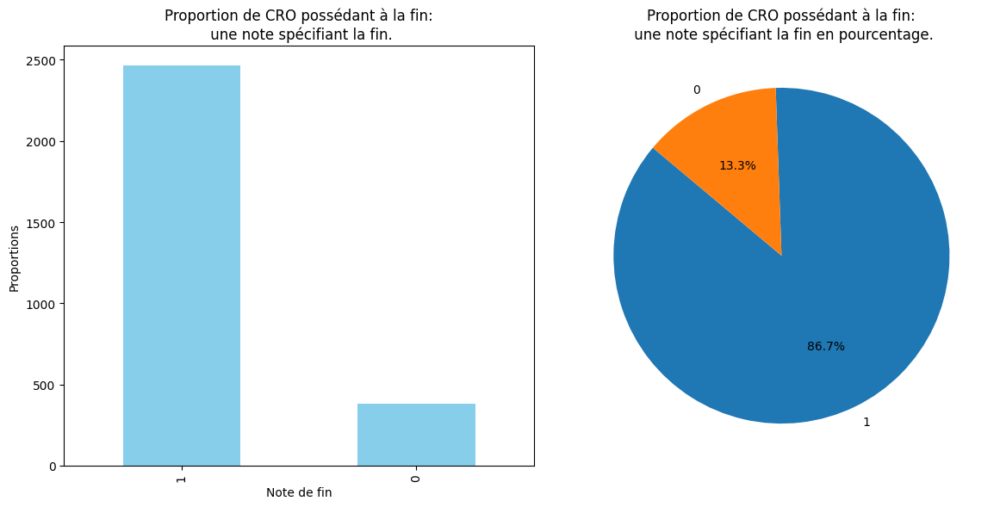

In [34]:
# Comptez les occurrences de chaque valeur dans la colonne
value_counts_note_fin = df_CRO_lang['note_fin'].value_counts()

# Créez un camembert
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
plt.pie(value_counts_note_fin, labels=value_counts_note_fin.index, autopct='%1.1f%%', startangle=140)
plt.title('Proportion de CRO possédant à la fin:\n une note spécifiant la fin en pourcentage.')

# Créez un graphique en barres
plt.subplot(1, 2, 1)
value_counts_note_fin.plot(kind='bar', color='skyblue')
plt.title('Proportion de CRO possédant à la fin:\n une note spécifiant la fin.')
plt.xlabel('Note de fin')
plt.ylabel('Proportions')

plt.tight_layout()

In [35]:
CRO_note_0 = df_CRO_lang.query('note_fin == 0').reset_index()
print('nb de CRO invalide:', len(CRO_note_0), '\n')
for i in range(0, len(CRO_note_0)):
    print(CRO_note_0.CRO[i], '\n')

nb de CRO invalide: 379 

Titre : Analyse histologique d'un prélévement unique de tissus biopsiquement collecté
Résumé :
Le présent rapport d'examen histologique concerne un échantillon unique de tissu biopsique, recevant le numéro de référence BP-001. Le prélèvement a été effectué sous la surveillance médicale et conformément aux protocoles établis par l'équipe interdisciplinaire du laboratoire d'anatomie pathologique. L'échantillon a été fixé immédiatement après extraction dans un solution formeldehydique 10%, suivi d'une période d'immersion de 24 heures minimum avant le début du traitement préparatoire.
L'étude macroscopique initiale a révélé que l'échantillon présente une apparence grossièrement homogène avec des dimensions approximatives de 3 cm x 2 cm x 1 cm. La section transversale montre une architecture cellulaire bien conservée sans signes évidents de nécrose ou dégradation tissulaire.
La préparation microscopique standard comprend les étapes suivantes : débullage, déplastifi

Dans les CRO qui ne possèdent pas de note de fin, plusieurs cas de figures sont présents. La plus grande partie représente des réponses dû à une erreur lors du processus de connection au modèle en ligne. Les autres sont des CRO non terminés ou en anglais. 

Il apparait que la "note : Ceci est un compte rendu fictif." n'apparait pas forcément sous cette forme dans le CRO. Uniquement 13% des CRO le possède tel quel. Les autres formes générées par le modèle sont : 
<li>Note: Ce rapport est fictif.</li>
<li>Note: Ce document est un compte rendu fictif</li>
<li>Note: Ce rapport est fictionnel</li>
<li>Note: Ce rapport opératoire est fictif</li>
<br>
Une fois les différentes possibilités prises en compte, cela représente 65.6% des CRO. Le chiffre actuel est obtenu après avoir analysé manuellement les CRO.

# Correspondance CRO et datas

In [36]:
df_CRO.head(5)

,CRO,id_diag,id_med,nir,source,operation,name_patient,address,birthday,name_med,organe,diagnostic,cancer
0,Résumé anatomo-pathologique\nPatient : Thomas ...,5,59,1 1980 08 14995 716 37,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Thomas Lemaire,"53, boulevard Auguste Lefèvre, 14995 Marty-la-...",31/08/1980,Dr Alice Brunet,peau,lichen plan,0
1,Résumé anatomopathologique\nPatient : Susan Ré...,20,8,2 1980 10 97375 990 10,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Susan Rémy,"rue Louis Colin, 97375 Texier-sur-Delmas",23/10/1980,Dr Antoine Jacquet,côlon,polypose adénomateuse familiale,1
2,Résumé anatomo-pathologique\nPatient : M Bertr...,12,4,1 1980 01 38964 514 29,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Bertrand Lemoine,"96, rue Honoré Hoareau, 38964 Delmas",10/01/1980,Dr Frédéric Martel,côlon,adénocarcinome,1
3,Résumé anatomopathologique\nPatient : Mme Virg...,4,1,2 1935 08 30194 424 27,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Virginie Gonzalez,"boulevard Nicole Marty, 30194 Saint Élisabethdan",27/08/1935,Dr Olivier Bernier,peau,lupus érythémateux,0
4,Résumé anatomopathologique\nPatient : M Benjam...,6,55,1 1948 12 72655 239 21,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Benjamin Vaillant,"65, avenue de Barre, 72655 Sainte Dominique",01/12/1948,Dr Chantal Laurent,peau,carcinome basocellulaire,1


In [37]:
# fonction permettant d'extraire les données des CRO

from datetime import datetime
import locale
# format français pour la date
locale.setlocale(locale.LC_TIME, 'fr_FR')

def trouver_occurrences(texte: str, mot: str) -> int:
    occurrence = []
    index = -1    
    try:
        texte_lower = texte.lower()
        mot_lower = mot.lower()
        while True:
            index = texte_lower.find(mot_lower, index + 1)
            if index == -1:
                break

            occurrence.append(index)
        nb_occurrence = len(occurrence)
        if nb_occurrence >= 1 :
            return nb_occurrence
        else:
            return 0
    except:
        return 0

## Ajout des colonnes vérifiants la présence des données dans les CRO

In [38]:
df_CRO_occurrence = df_CRO_lang.copy(deep=True)

df_CRO_occurrence['nb_diag'] = df_CRO_occurrence.apply(lambda row: trouver_occurrences(row['CRO'], row['diagnostic']), axis=1)
df_CRO_occurrence['diag_pr'] = df_CRO_occurrence['nb_diag'].apply(lambda x: 1 if x > 0 else 0)

df_CRO_occurrence['nb_med'] = df_CRO_occurrence.apply(lambda row: trouver_occurrences(row['CRO'], row['name_med']), axis=1)
df_CRO_occurrence['med_pr'] = df_CRO_occurrence['nb_med'].apply(lambda x: 1 if x > 0 else 0)

df_CRO_occurrence['nb_patient'] = df_CRO_occurrence.apply(lambda row: trouver_occurrences(row['CRO'], row['name_patient']), axis=1)
df_CRO_occurrence['patient_pr'] = df_CRO_occurrence['nb_patient'].apply(lambda x: 1 if x > 0 else 0)

df_CRO_occurrence['nb_birthday'] = df_CRO_occurrence.apply(lambda row: trouver_occurrences(row['CRO'], row['birthday']), axis=1)
df_CRO_occurrence['birthday_pr'] = df_CRO_occurrence['nb_birthday'].apply(lambda x: 1 if x > 0 else 0)

df_CRO_occurrence['nb_address'] = df_CRO_occurrence.apply(lambda row: trouver_occurrences(row['CRO'], row['address']), axis=1)
df_CRO_occurrence['address_pr'] = df_CRO_occurrence['nb_address'].apply(lambda x: 1 if x > 0 else 0)

df_CRO_occurrence['nb_nir'] = df_CRO_occurrence.apply(lambda row: trouver_occurrences(row['CRO'], row['nir']), axis=1)
df_CRO_occurrence['nir_pr'] = df_CRO_occurrence['nb_nir'].apply(lambda x: 1 if x > 0 else 0)

df_CRO_occurrence['note'] = df_CRO_occurrence['diag_pr'] + df_CRO_occurrence['med_pr'] + df_CRO_occurrence['patient_pr'] + df_CRO_occurrence['birthday_pr']\
    + df_CRO_occurrence['address_pr'] + df_CRO_occurrence['nir_pr'] 

In [39]:
df_CRO_occurrence.head(5)

,CRO,id_diag,id_med,nir,source,operation,name_patient,address,birthday,name_med,...,med_pr,nb_patient,patient_pr,nb_birthday,birthday_pr,nb_address,address_pr,nb_nir,nir_pr,note
0,Résumé anatomo-pathologique\nPatient : Thomas ...,5,59,1 1980 08 14995 716 37,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Thomas Lemaire,"53, boulevard Auguste Lefèvre, 14995 Marty-la-...",31/08/1980,Dr Alice Brunet,...,1,2,1,1,1,1,1,1,1,6
1,Résumé anatomopathologique\nPatient : Susan Ré...,20,8,2 1980 10 97375 990 10,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Susan Rémy,"rue Louis Colin, 97375 Texier-sur-Delmas",23/10/1980,Dr Antoine Jacquet,...,1,2,1,1,1,1,1,1,1,6
2,Résumé anatomo-pathologique\nPatient : M Bertr...,12,4,1 1980 01 38964 514 29,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Bertrand Lemoine,"96, rue Honoré Hoareau, 38964 Delmas",10/01/1980,Dr Frédéric Martel,...,1,3,1,1,1,1,1,1,1,6
3,Résumé anatomopathologique\nPatient : Mme Virg...,4,1,2 1935 08 30194 424 27,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Virginie Gonzalez,"boulevard Nicole Marty, 30194 Saint Élisabethdan",27/08/1935,Dr Olivier Bernier,...,1,1,1,1,1,1,1,1,1,6
4,Résumé anatomopathologique\nPatient : M Benjam...,6,55,1 1948 12 72655 239 21,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Benjamin Vaillant,"65, avenue de Barre, 72655 Sainte Dominique",01/12/1948,Dr Chantal Laurent,...,1,1,1,1,1,1,1,1,1,6


## La présence des diagnostics dans les CRO

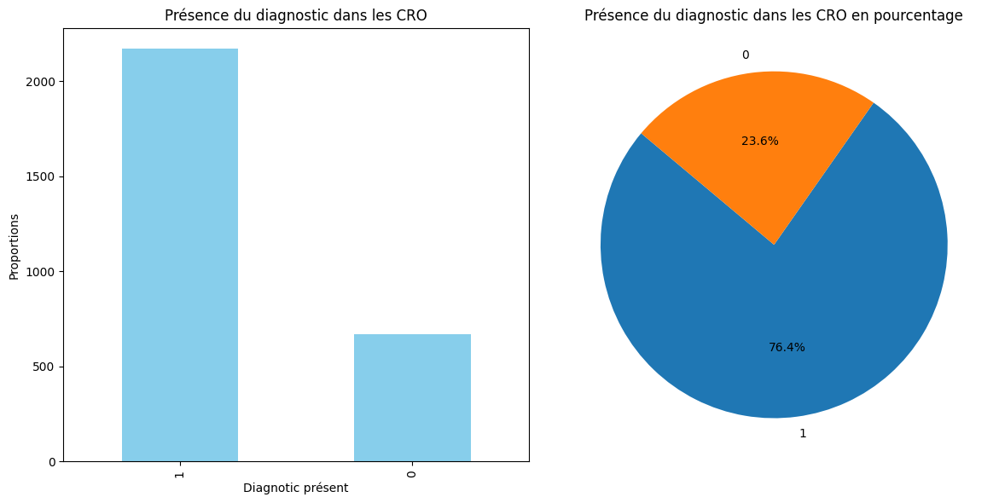

In [40]:
# Présence des diagnostics dans les CRO
value_counts_diag_nb = df_CRO_occurrence['diag_pr'].value_counts()

# Créez un camembert
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
plt.pie(value_counts_diag_nb, labels=value_counts_diag_nb.index, autopct='%1.1f%%', startangle=140)
plt.title('Présence du diagnostic dans les CRO en pourcentage')

# Créez un graphique en barres
plt.subplot(1, 2, 1)
value_counts_diag_nb.plot(kind='bar', color='skyblue')
plt.title('Présence du diagnostic dans les CRO')
plt.xlabel('Diagnotic présent')
plt.ylabel('Proportions')

plt.tight_layout()

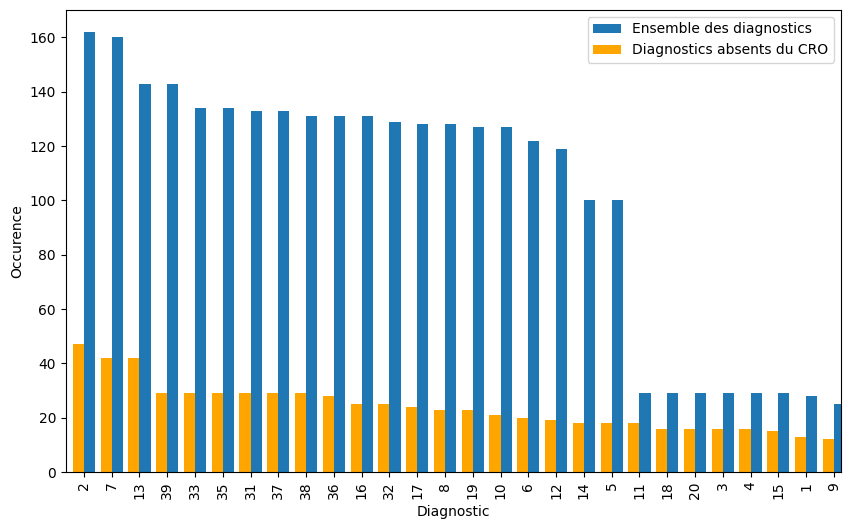

In [41]:
# détermination des diagnostics absents des CRO

diagnostics_absent = df_CRO_occurrence.query('diag_pr == 0')

# Initialisez le graphique
fig, ax = plt.subplots(figsize=(10, 6))

# Graphique de l'ensemble du DataFrame
df_CRO['id_diag'].value_counts().plot(kind='bar', ax=ax, position=0, width=0.4, label='Ensemble des diagnostics')

# Graphique du sous-ensemble filtré
diagnostics_absent['id_diag'].value_counts().plot(kind='bar', ax=ax, position=1, width=0.4, color='orange', label='Diagnostics absents du CRO')
ax.set_xlabel('Diagnostic')
ax.set_ylabel('Occurence')
ax.legend()

In [42]:
diag = 1
query = f'(id_diag == {diag}) and (diag_pr == 0)'
sans_diag = df_CRO_occurrence.query(query).index
print(len(sans_diag), 'CRO concernés')

for index in sans_diag:
    print(index)
    CRO_sans_diag = df_CRO_occurrence.query(query).CRO[index]
    print(CRO_sans_diag, '\n')

13 CRO concernés
375
Résumé opératoire d'Histopathologie
Patient : Guillaume Samson
Date de naissance : 19/06/1948
Adresse : 611, boulevard Rey, 65501 Saint Anneville
Numéro de Sécurité Social : 1 1948 06 65501 880 61
Données Personnelles :
Patient masculin, âgé de 73 ans, résidant à Saint Anneville.
Description Macroscopique :
Examen d'une pièce de peau rougeâtre, érythémateuse, mesurant environ 0,5 cm x 0,5 cm, obtenue lors d'une biopsie cutanée localisée sur le dos du patient. La zone biopsiée présentait des plaques papuleuses argentées recouvertes d'écailles silicone-like. Aucun signes inflammatoires ou infectieux n'ont été observés.
Description Microscopique :
A l'examen histologique, on note une hyperprolifération epidermique associée à une acanthose bipolaire. Des infiltrats granulomateux profonds sont présents, comprenant des lymphocytes T CD4+ et CD8+, des macrophages et des fibroblasts actifs. Il y a également des foyers 

405
Current Model
mistralai/Mistral-7B-Instruct-v0.2


Dans les cas où le diagnostic n'était pas présent dans le CRO, il apparait que cela est dû à une faute d'orthographe, ou un nom alternatif à la maladie, voir l'utilisation d'un acronyme.
Les diagnostics mal orthographiés par le modèle : 
<li>lichen scléréus</li>
<li>Pietriasis Rosée de Gibert/pitiriase rose de Gilbert/Pityriasis Rosée de Gibert/pitiriase rose de Gibert/pitiriase rosée de Gilbert</li>
<li>carcinome colon-rectal hereditaire non polyposique/carcinome colorectal héréditaire non polypoïdien/adénocarcinome colorectal héréditaire non polyposique/adenocarcinome colorectal hereditaire non polyposique/carcinome hereditaire non polyposique du côlon/carcinome colorectal héréditaire non polyposique/carcinome colon-rectal héréditaire non polyposique/adenocarcinome colorectal héréditaire non polyposique</li>
<li>carcinome neuroendocrine différentié du côlon/arcinome neuroendocrinien/carcinome neuroendocrine</li>
<li>carcinome carcinoïde/Carcinome à Cellules Carcinoides/adenocarcinome à cellules carcinoïdes</li>
<li>rosacea/rosacee/rosace</li>
<li>melanome</li>
<li>colite ischrémique</li>
<li>sarcome à cellules fusiformes de Kaposi/sarcome kaposidien à cells fusiformes</li>
<li>carcinome adénocarcinomaide/carcinome adénocarcinomate</li>
<li>carcinome adénocarcinomate</li>
<li>polype adénomateux familial</li>
<li>lupus erythematosus</li>
<li>carcinome colon-rectal hereditaire non polyposique</li>
<li>lichén plan</li>
<br>
Pour réduire cette quantité de CRO non validé, il a fallut remplacer le diagnostic erroné par le bonne orthographe.

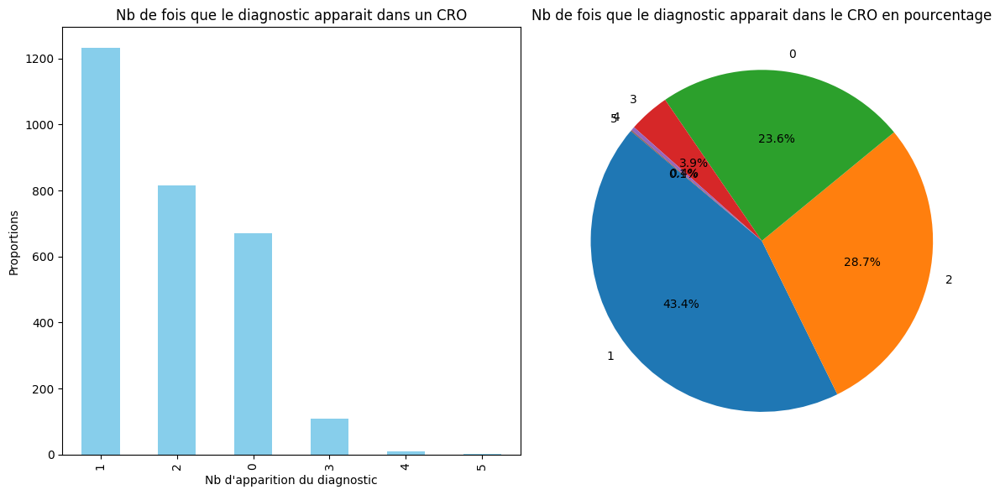

In [43]:
# Comptez les occurrences de chaque valeur dans la colonne
value_counts_diag_occ = df_CRO_occurrence['nb_diag'].value_counts()

# Créez un camembert
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
plt.pie(value_counts_diag_occ, labels=value_counts_diag_occ.index, autopct='%1.1f%%', startangle=140)
plt.title("Nb de fois que le diagnostic apparait dans le CRO en pourcentage")

# Créez un graphique en barres
plt.subplot(1, 2, 1)
value_counts_diag_occ.plot(kind='bar', color='skyblue')
plt.title("Nb de fois que le diagnostic apparait dans un CRO")
plt.xlabel("Nb d'apparition du diagnostic")
plt.ylabel('Proportions')

plt.tight_layout()

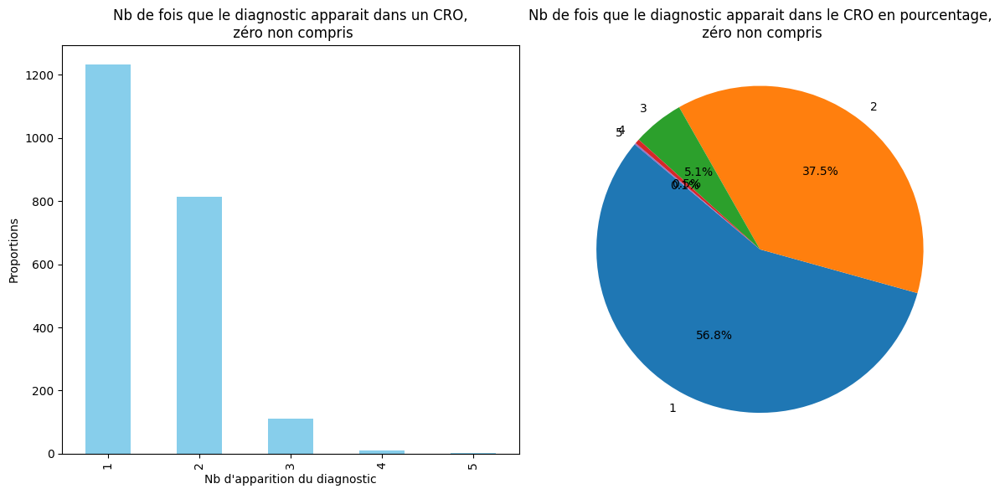

In [44]:
# Comptez les occurrences de chaque valeur dans la colonne
value_counts_diag_occ_sans_med = df_CRO_occurrence.query('nb_diag != 0')['nb_diag'].value_counts()

# Créez un camembert
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
plt.pie(value_counts_diag_occ_sans_med, labels=value_counts_diag_occ_sans_med.index, autopct='%1.1f%%', startangle=140)
plt.title("Nb de fois que le diagnostic apparait dans le CRO en pourcentage,\n zéro non compris")

# Créez un graphique en barres
plt.subplot(1, 2, 1)
value_counts_diag_occ_sans_med.plot(kind='bar', color='skyblue')
plt.title("Nb de fois que le diagnostic apparait dans un CRO,\n zéro non compris")
plt.xlabel("Nb d'apparition du diagnostic")
plt.ylabel('Proportions')

plt.tight_layout()

In [45]:
CRO_occ_query = df_CRO_occurrence.query('nb_diag == 5').reset_index()
for index in range(0, len(CRO_occ_query)):
    print(CRO_occ_query.CRO[index], '\n')

Résumé anatomo-pathologique
Patient : Mme Susan Rémy
Date de naissance : 23 octobre 1980
Adresse : Rue Louis Colin, 97375 Texier-sur-Delmas
Numéro de Sécurité Social : 2 1980 10 97375 990 10
Description macroscopique :
L'échantillon récolté pèse approximativement 1200 grammes. La muqueuse colonicelle apparaît normale jusqu'à environ 6 cm à partir de l'orifice anal. À ce niveau, on note la présence d'un polyphe sanguin rouge vif, mesurant environ 4 cm de diamètre. L'intérieur du polype est hémorrhagique. Aucune autre masse tumorale ou signe inflammatoires ne sont observés dans les segments coliques examinés.
Description microscopique :
Le polype est histologiquement classé comme syndrome de Lynch, type syncytlele cellulaire (mucineux), modérément différentié. Les glandes tubulaires présentent des atypies cytologiques marquées, avec des cellules tumorales arrondies et hyperchromatiques, ainsi qu'une forte mitose. Des zones d'invasion submucosale et musculaire sont identifiées. Les marges

## La présence de l'anatomopathologiste dans le CRO

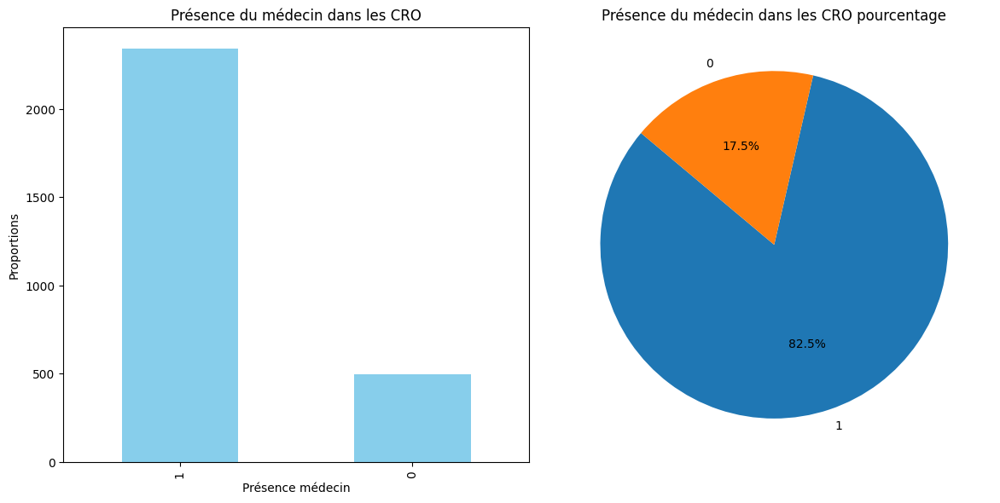

In [46]:
# Comptez les occurrences de chaque valeur dans la colonne
value_counts_med_pr = df_CRO_occurrence['med_pr'].value_counts()

# Créez un camembert
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
plt.pie(value_counts_med_pr, labels=value_counts_med_pr.index, autopct='%1.1f%%', startangle=140)
plt.title('Présence du médecin dans les CRO pourcentage')

# Créez un graphique en barres
plt.subplot(1, 2, 1)
value_counts_med_pr.plot(kind='bar', color='skyblue')
plt.title('Présence du médecin dans les CRO')
plt.xlabel('Présence médecin')
plt.ylabel('Proportions')

plt.tight_layout()

In [47]:
index_sans_med = df_CRO_occurrence.query('med_pr == 0').index
for index in index_sans_med:
    print('médecin', df_CRO_occurrence.name_med[index], index)
    print(df_CRO_occurrence.CRO[index], '\n')

médecin Dr Émilie Baron 12
Titre : Analyse histologique d'un prélévement unique de tissus biopsiquement collecté
Résumé :
Le présent rapport d'examen histologique concerne un échantillon unique de tissu biopsique, recevant le numéro de référence BP-001. Le prélèvement a été effectué sous la surveillance médicale et conformément aux protocoles établis par l'équipe interdisciplinaire du laboratoire d'anatomie pathologique. L'échantillon a été fixé immédiatement après extraction dans un solution formeldehydique 10%, suivi d'une période d'immersion de 24 heures minimum avant le début du traitement préparatoire.
L'étude macroscopique initiale a révélé que l'échantillon présente une apparence grossièrement homogène avec des dimensions approximatives de 3 cm x 2 cm x 1 cm. La section transversale montre une architecture cellulaire bien conservée sans signes évidents de nécrose ou dégradation tissulaire.
La préparation microscopique standard comprend les étapes suivantes : débullage, déplastif

De même que pour l'absence de diagnostic, cela est dû à des erreurs d'orthographe ou une inversion entre le nom et le prénom. Il était absent dans 28,2% des CRO avant ajout manuel.

## La présence du patient dans le CRO

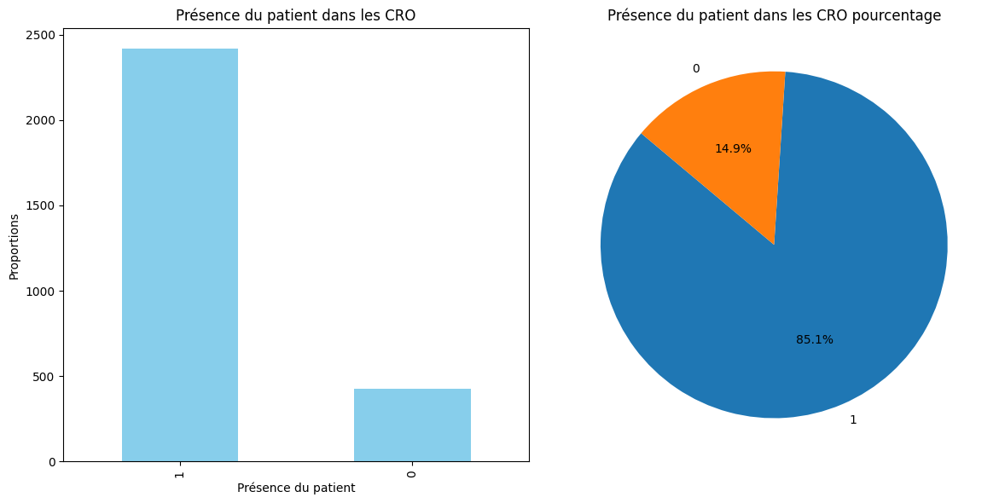

In [48]:
# Comptez les occurrences de chaque valeur dans la colonne
value_counts_patient_pr = df_CRO_occurrence['patient_pr'].value_counts()

# Créez un camembert
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
plt.pie(value_counts_patient_pr, labels=value_counts_patient_pr.index, autopct='%1.1f%%', startangle=140)
plt.title('Présence du patient dans les CRO pourcentage')

# Créez un graphique en barres
plt.subplot(1, 2, 1)
value_counts_patient_pr.plot(kind='bar', color='skyblue')
plt.title('Présence du patient dans les CRO')
plt.xlabel('Présence du patient')
plt.ylabel('Proportions')

plt.tight_layout()

In [49]:
index_CRO_sans_patient = df_CRO_occurrence.query('patient_pr == 0').index
for index in index_CRO_sans_patient:
    print(index)
    print(df_CRO_occurrence.CRO[index], '\n')

12
Titre : Analyse histologique d'un prélévement unique de tissus biopsiquement collecté
Résumé :
Le présent rapport d'examen histologique concerne un échantillon unique de tissu biopsique, recevant le numéro de référence BP-001. Le prélèvement a été effectué sous la surveillance médicale et conformément aux protocoles établis par l'équipe interdisciplinaire du laboratoire d'anatomie pathologique. L'échantillon a été fixé immédiatement après extraction dans un solution formeldehydique 10%, suivi d'une période d'immersion de 24 heures minimum avant le début du traitement préparatoire.
L'étude macroscopique initiale a révélé que l'échantillon présente une apparence grossièrement homogène avec des dimensions approximatives de 3 cm x 2 cm x 1 cm. La section transversale montre une architecture cellulaire bien conservée sans signes évidents de nécrose ou dégradation tissulaire.
La préparation microscopique standard comprend les étapes suivantes : débullage, déplastification, hydratation, ém

Idem que pour la détection des anatomopathologistes. Le patient n'est pas présent ou mal orthographié dans 21,5% des CRO.

## La présence de la date de naissance dans les CRO

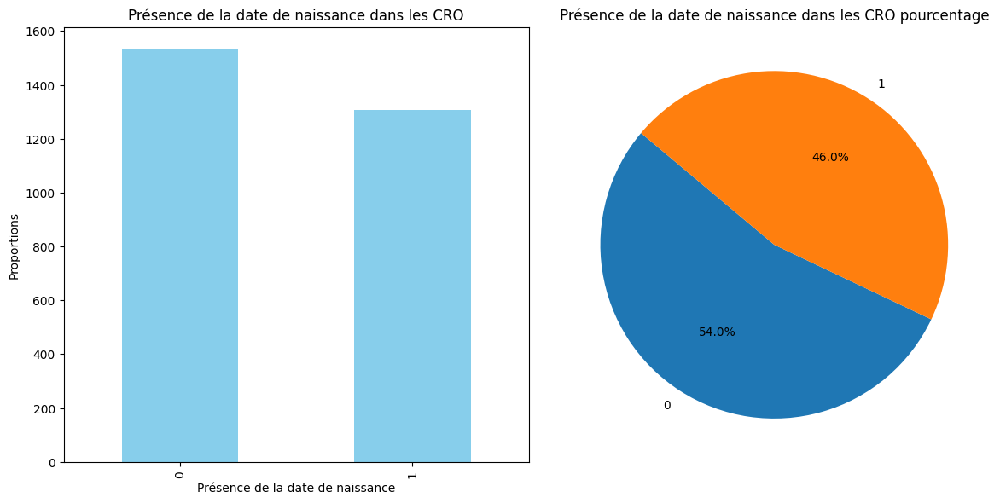

In [50]:
# Comptez les occurrences de chaque valeur dans la colonne
value_counts_date_pr = df_CRO_occurrence['birthday_pr'].value_counts()

# Créez un camembert
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
plt.pie(value_counts_date_pr, labels=value_counts_date_pr.index, autopct='%1.1f%%', startangle=140)
plt.title('Présence de la date de naissance dans les CRO pourcentage')

# Créez un graphique en barres
plt.subplot(1, 2, 1)
value_counts_date_pr.plot(kind='bar', color='skyblue')
plt.title('Présence de la date de naissance dans les CRO')
plt.xlabel('Présence de la date de naissance')
plt.ylabel('Proportions')

plt.tight_layout()

In [51]:
index_CRO_sans_date = df_CRO_occurrence.query('birthday_pr == 0').index
for index in index_CRO_sans_date:
    print(index)
    print(df_CRO_occurrence.CRO[index], '\n')

12
Titre : Analyse histologique d'un prélévement unique de tissus biopsiquement collecté
Résumé :
Le présent rapport d'examen histologique concerne un échantillon unique de tissu biopsique, recevant le numéro de référence BP-001. Le prélèvement a été effectué sous la surveillance médicale et conformément aux protocoles établis par l'équipe interdisciplinaire du laboratoire d'anatomie pathologique. L'échantillon a été fixé immédiatement après extraction dans un solution formeldehydique 10%, suivi d'une période d'immersion de 24 heures minimum avant le début du traitement préparatoire.
L'étude macroscopique initiale a révélé que l'échantillon présente une apparence grossièrement homogène avec des dimensions approximatives de 3 cm x 2 cm x 1 cm. La section transversale montre une architecture cellulaire bien conservée sans signes évidents de nécrose ou dégradation tissulaire.
La préparation microscopique standard comprend les étapes suivantes : débullage, déplastification, hydratation, ém

Pour la date de naissance, elle pouvait apparaitre sous la forme anglaise (MM/JJ/AAAA) ou bien écrite en toutes lettres (français et anglais). Elle est absente dans 18,7% des CRO.

## La présence de l'adresse du patient dans les CRO

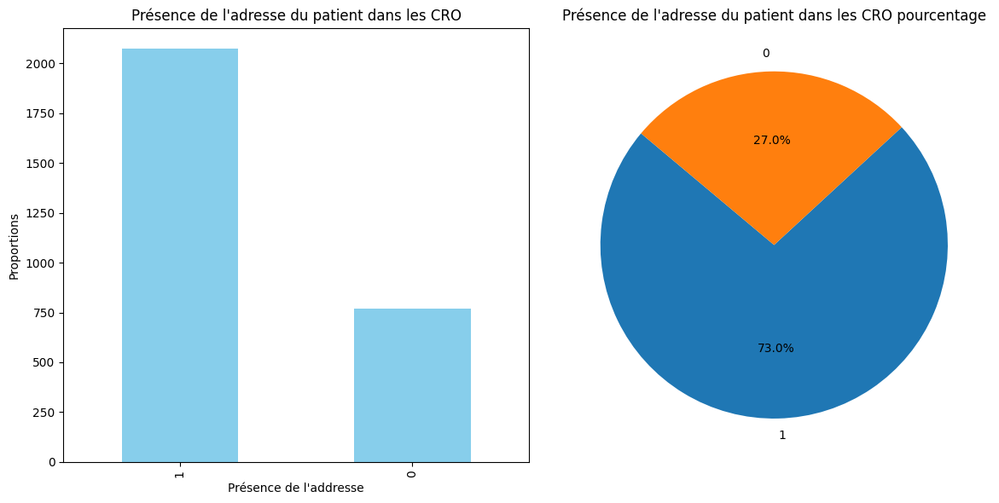

In [52]:
# Comptez les occurrences de chaque valeur dans la colonne
value_counts_address_pr = df_CRO_occurrence['address_pr'].value_counts()

# Créez un camembert
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
plt.pie(value_counts_address_pr, labels=value_counts_address_pr.index, autopct='%1.1f%%', startangle=140)
plt.title("Présence de l'adresse du patient dans les CRO pourcentage")

# Créez un graphique en barres
plt.subplot(1, 2, 1)
value_counts_address_pr.plot(kind='bar', color='skyblue')
plt.title("Présence de l'adresse du patient dans les CRO")
plt.xlabel("Présence de l'addresse")
plt.ylabel('Proportions')

plt.tight_layout()

In [53]:
index_CRO_sans_address = df_CRO_occurrence.query('address_pr == 0').index
for index in index_CRO_sans_address:
    print(index)
    print(df_CRO_occurrence.CRO[index], '\n')

12
Titre : Analyse histologique d'un prélévement unique de tissus biopsiquement collecté
Résumé :
Le présent rapport d'examen histologique concerne un échantillon unique de tissu biopsique, recevant le numéro de référence BP-001. Le prélèvement a été effectué sous la surveillance médicale et conformément aux protocoles établis par l'équipe interdisciplinaire du laboratoire d'anatomie pathologique. L'échantillon a été fixé immédiatement après extraction dans un solution formeldehydique 10%, suivi d'une période d'immersion de 24 heures minimum avant le début du traitement préparatoire.
L'étude macroscopique initiale a révélé que l'échantillon présente une apparence grossièrement homogène avec des dimensions approximatives de 3 cm x 2 cm x 1 cm. La section transversale montre une architecture cellulaire bien conservée sans signes évidents de nécrose ou dégradation tissulaire.
La préparation microscopique standard comprend les étapes suivantes : débullage, déplastification, hydratation, ém

Pour les cas où l'adresse était manquante, cela était du à des fautes au niveau de la ville fictive . Il est absent ou mal orthographié dans 40,7% des CRO.

## Note finale

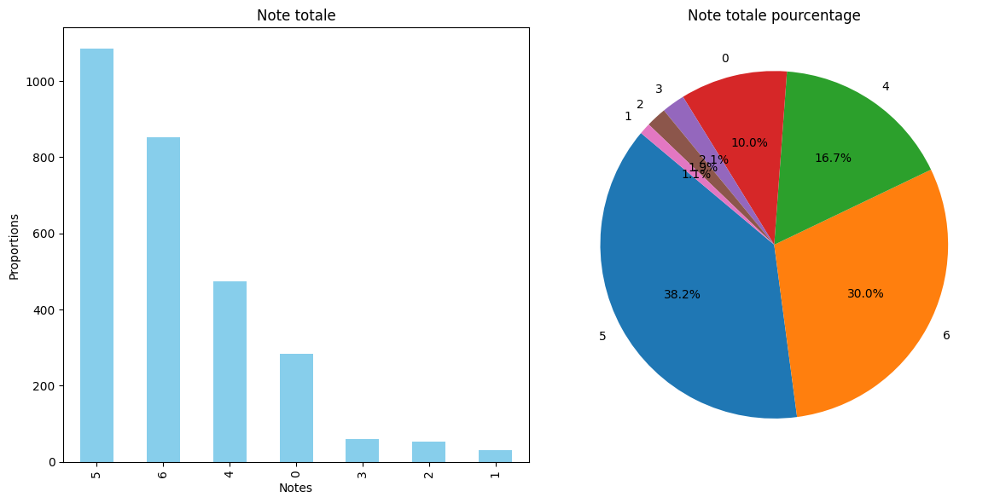

In [54]:
# Comptez les occurrences de chaque valeur dans la colonne
value_counts_note = df_CRO_occurrence['note'].value_counts()

# Créez un camembert
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
plt.pie(value_counts_note, labels=value_counts_note.index, autopct='%1.1f%%', startangle=140)
plt.title("Note totale pourcentage")

# Créez un graphique en barres
plt.subplot(1, 2, 1)
value_counts_note.plot(kind='bar', color='skyblue')
plt.title("Note totale")
plt.xlabel('Notes')
plt.ylabel('Proportions')

plt.tight_layout()

# Répartition en type de prélèvement

In [55]:
df_CRO_type = df_CRO_occurrence.copy(deep=True)

In [56]:
df_CRO_type['operation'].unique()

array(['biopsie', 'colectomie', 'exérèse'], dtype=object)

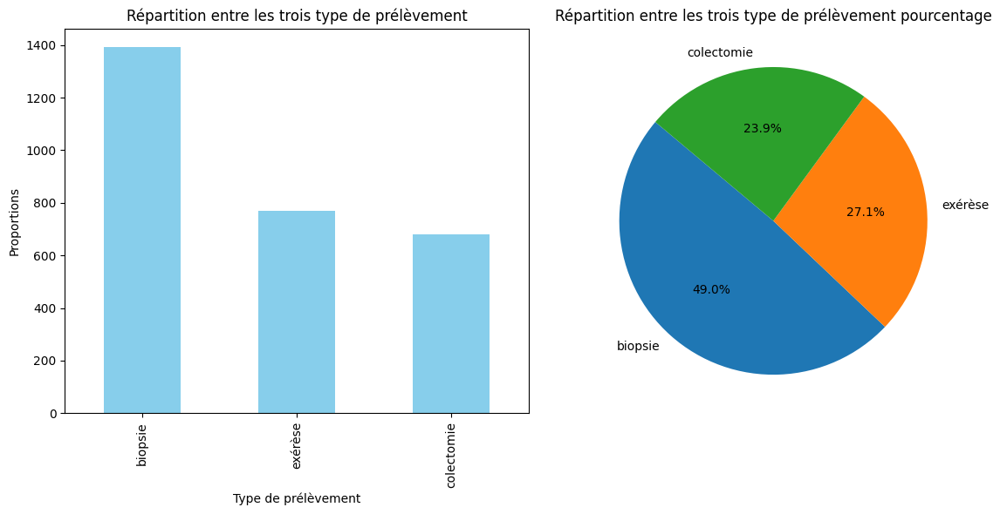

In [57]:
# Comptez les occurrences de chaque valeur dans la colonne
value_counts_type = df_CRO_type['operation'].value_counts()

# Créez un camembert
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
plt.pie(value_counts_type, labels=value_counts_type.index, autopct='%1.1f%%', startangle=140)
plt.title("Répartition entre les trois type de prélèvement pourcentage")

# Créez un graphique en barres
plt.subplot(1, 2, 1)
value_counts_type.plot(kind='bar', color='skyblue')
plt.title("Répartition entre les trois type de prélèvement")
plt.xlabel('Type de prélèvement')
plt.ylabel('Proportions')

plt.tight_layout()

# CRO valides

## Filtration vis à vis des différents paramètres d'un CRO valide

### La langue

Lors de l'EDA, il apparait que certain CRO ne sont pas en français, ou pas entièrement. Ainsi pour s'assurer que notre modèle Spacy s'entraine correctement, seuls les CRO indiqués comme fr, 1.0 sont conservés.

In [58]:
df_CRO_lang.head(5)

,CRO,id_diag,id_med,nir,source,operation,name_patient,address,birthday,name_med,organe,diagnostic,cancer,language_proportions,nb_word,tranche,note_fin
0,Résumé anatomo-pathologique\nPatient : Thomas ...,5,59,1 1980 08 14995 716 37,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Thomas Lemaire,"53, boulevard Auguste Lefèvre, 14995 Marty-la-...",31/08/1980,Dr Alice Brunet,peau,lichen plan,0,"fr, 1.0",262,250-299,1
1,Résumé anatomopathologique\nPatient : Susan Ré...,20,8,2 1980 10 97375 990 10,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Susan Rémy,"rue Louis Colin, 97375 Texier-sur-Delmas",23/10/1980,Dr Antoine Jacquet,côlon,polypose adénomateuse familiale,1,"fr, 1.0",271,250-299,1
2,Résumé anatomo-pathologique\nPatient : M Bertr...,12,4,1 1980 01 38964 514 29,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Bertrand Lemoine,"96, rue Honoré Hoareau, 38964 Delmas",10/01/1980,Dr Frédéric Martel,côlon,adénocarcinome,1,"fr, 1.0",307,300-349,1
3,Résumé anatomopathologique\nPatient : Mme Virg...,4,1,2 1935 08 30194 424 27,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Virginie Gonzalez,"boulevard Nicole Marty, 30194 Saint Élisabethdan",27/08/1935,Dr Olivier Bernier,peau,lupus érythémateux,0,"fr, 1.0",247,200-249,1
4,Résumé anatomopathologique\nPatient : M Benjam...,6,55,1 1948 12 72655 239 21,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Benjamin Vaillant,"65, avenue de Barre, 72655 Sainte Dominique",01/12/1948,Dr Chantal Laurent,peau,carcinome basocellulaire,1,"fr, 1.0",210,200-249,1


In [59]:
df_CRO_filtre_1 = df_CRO_type.query('language_proportions == "fr, 1.0"')
print('Taille originale du df CRO:', len(df_CRO_type), 'CRO,')
print('taille après filtrage de la langue (fr 100%):', len(df_CRO_filtre_1), 'CRO,')
print('soit une perte de', round((len(df_CRO_type) - len(df_CRO_filtre_1)) * 100 / len(df_CRO_type), 2), '%.')

Taille originale du df CRO: 2842 CRO,
taille après filtrage de la langue (fr 100%): 2600 CRO,
soit une perte de 8.52 %.


### La présence de toutes les données

Pour l'entrainement de Spacy, il faut déterminer les index des entitées recherchées dans les CRO. Pour certain, ils sont simplement absent, car la génération de la réponse s'est stoppée trop tôt, pour d'autres, c'est la langue, mais le filtre précédent résout ce problème. Ainsi, seuls les CRO ayant une note de 6, qui correspont aux différentes entitées qui seront recherchés, sont conservés.

In [60]:
df_CRO_filtre_2 = df_CRO_filtre_1.query('diag_pr == 1')
print('Taille après filtrage de la note (6/6):', len(df_CRO_filtre_2), 'CRO,')
print('soit une perte de', round((len(df_CRO_type) - len(df_CRO_filtre_2)) * 100 / len(df_CRO_type), 2), '% par rapport au df sans filtre.')

Taille après filtrage de la note (6/6): 2171 CRO,
soit une perte de 23.61 % par rapport au df sans filtre.


### La présence de la note de fin

In [61]:
df_CRO_filtre_3 = df_CRO_filtre_2.query('note_fin == 1')
print('Taille après filtrage de la présence de la note de fin:', len(df_CRO_filtre_3), 'CRO,')
print('soit une perte de', round((len(df_CRO_type) - len(df_CRO_filtre_3)) * 100 / len(df_CRO_type), 2), '% par rapport au df sans filtre.')

Taille après filtrage de la présence de la note de fin: 2140 CRO,
soit une perte de 24.7 % par rapport au df sans filtre.


In [62]:
df_CRO_filtre_3_reinit = df_CRO_filtre_3.reset_index(drop=True)
for index in range(0, len(df_CRO_filtre_3_reinit) -1):
    print(df_CRO_filtre_3_reinit.CRO[index], '\n')

Résumé anatomo-pathologique
Patient : Thomas Lemaire
Date de naissance : 31/08/1980
Adresse : 53, boulevard Auguste Lefèvre, 14995 Marty-la-Forêt
Numéro de Sécurité Social : 1 1980 08 14995 716 37
Rappels des données personnelles :
L'examen histopathologique a été réalisé sur un prélèvement tissulaire obtenu durant une biopsie cutanée effectuée sur le patient Thomas Lemaire.
Description macrogasthique :
Le prélèvement présentait une apparence grossièrement hétérogène, avec présence de zones sanguinolentes et d'autres régions plus pallides. La section transversale mesurait environ 2 cm x 1,5 cm. Aucune ulcération ni signes inflammatoires évidents n'ont été observés à l'œil nu.
Description microscopique :
À l'examen microscopique, on note la présence d'un infiltrat lymphocytaire superficiel et profond dans les couches papillaires et reticulaires de la peau. Les kératinocytes supra-basaux montrent une hyperkératose et des acanthoses bipolares. Des bandes subepidermiques de liquide mucosal

# EDA après filtration

## La source (après filtration)

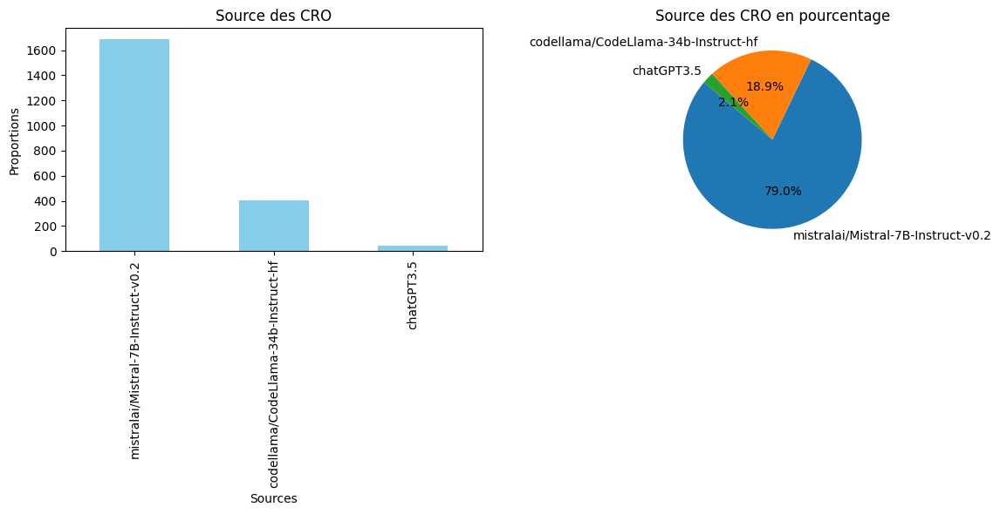

In [63]:
# Comptez les occurrences de chaque valeur dans la colonne
value_counts = df_CRO_filtre_3_reinit['source'].value_counts()

# Créez un camembert
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
plt.pie(value_counts, labels=value_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Source des CRO en pourcentage')

# Créez un graphique en barres
plt.subplot(1, 2, 1)
value_counts.plot(kind='bar', color='skyblue')
plt.title('Source des CRO')
plt.xlabel('Sources')
plt.ylabel('Proportions')

plt.tight_layout()

## Le type de prélèvement (après filtrage)

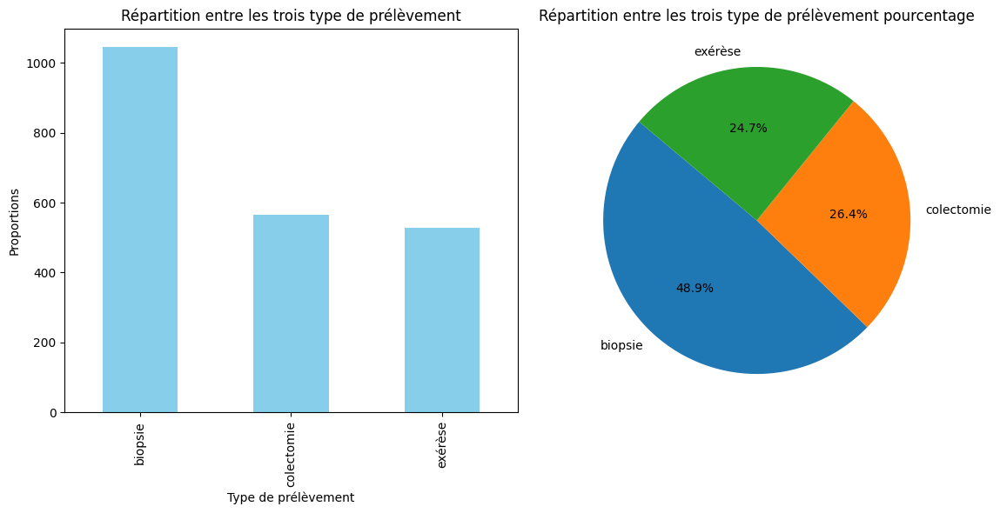

In [64]:
# Comptez les occurrences de chaque valeur dans la colonne
value_counts = df_CRO_filtre_3_reinit['operation'].value_counts()

# Créez un camembert
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
plt.pie(value_counts, labels=value_counts.index, autopct='%1.1f%%', startangle=140)
plt.title("Répartition entre les trois type de prélèvement pourcentage")

# Créez un graphique en barres
plt.subplot(1, 2, 1)
value_counts.plot(kind='bar', color='skyblue')
plt.title("Répartition entre les trois type de prélèvement")
plt.xlabel('Type de prélèvement')
plt.ylabel('Proportions')

plt.tight_layout()

## Les anatomopathologistes (après filtration)

Text(0, 0.5, 'Occurence')

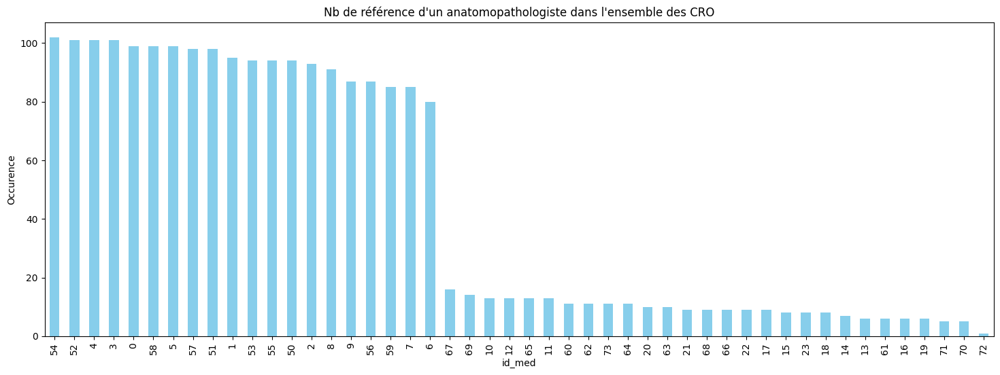

In [65]:
value_counts = df_CRO_filtre_3_reinit['id_med'].value_counts()

plt.figure(figsize=(18, 6))
value_counts.plot(kind='bar', color='skyblue')
plt.title("Nb de référence d'un anatomopathologiste dans l'ensemble des CRO")
plt.xlabel('id_med')
plt.ylabel('Occurence')

## Les patients (après filtration)

Text(0, 0.5, 'Occurence')

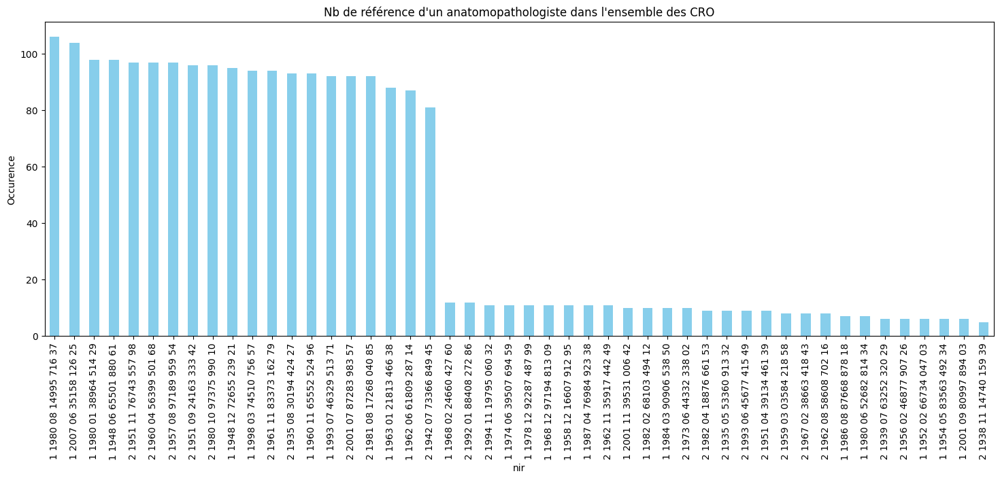

In [66]:
value_counts = df_CRO_filtre_3_reinit['nir'].value_counts()

plt.figure(figsize=(18, 6))
value_counts.plot(kind='bar', color='skyblue')
plt.title("Nb de référence d'un anatomopathologiste dans l'ensemble des CRO")
plt.xlabel('nir')
plt.ylabel('Occurence')

## Les diagnostics (après filtration)

In [67]:
diags_train_valid = diagnostics.query('organe != "foie"')
print("nb de diagnostics en référence:", len(diags_train_valid))
nb_diags = df_CRO_filtre_3_reinit.id_diag.unique()
print("nb de diagnostics qui apparaissent dans les CRO:", len(nb_diags))

nb de diagnostics en référence: 20
nb de diagnostics qui apparaissent dans les CRO: 20


Text(0, 0.5, 'Occurence')

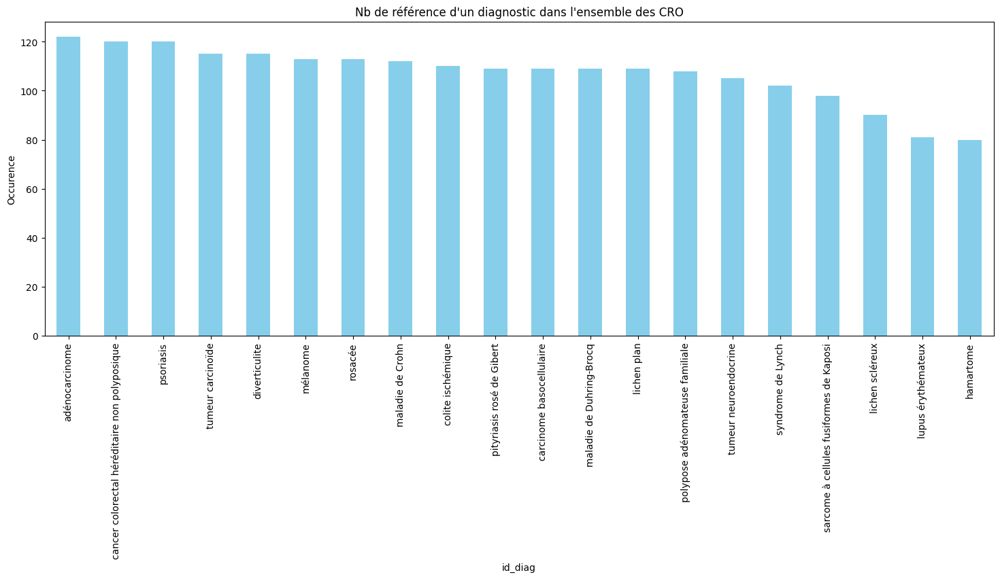

In [68]:
value_counts = df_CRO_filtre_3_reinit['diagnostic'].value_counts()

plt.figure(figsize=(18, 6))
value_counts.plot(kind='bar', color='skyblue')
plt.title("Nb de référence d'un diagnostic dans l'ensemble des CRO")
plt.xlabel('id_diag')
plt.ylabel('Occurence')

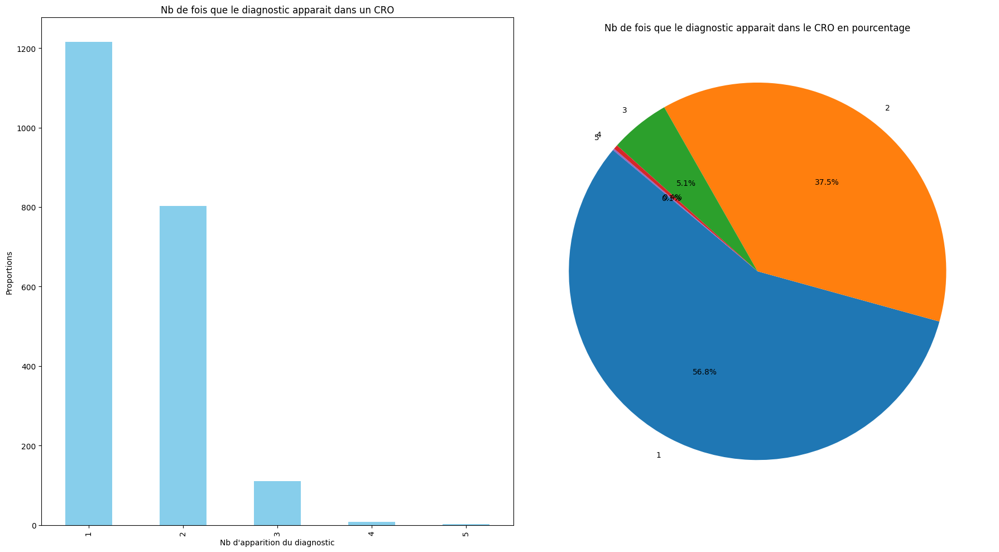

In [69]:
# Comptez les occurrences de chaque valeur dans la colonne
value_counts = df_CRO_filtre_3_reinit['nb_diag'].value_counts()

# Créez un camembert
plt.figure(figsize=(18, 10))
plt.subplot(1, 2, 2)
plt.pie(value_counts, labels=value_counts.index, autopct='%1.1f%%', startangle=140)
plt.title("Nb de fois que le diagnostic apparait dans le CRO en pourcentage")

# Créez un graphique en barres
plt.subplot(1, 2, 1)
value_counts.plot(kind='bar', color='skyblue')
plt.title("Nb de fois que le diagnostic apparait dans un CRO")
plt.xlabel("Nb d'apparition du diagnostic")
plt.ylabel('Proportions')

plt.tight_layout()

## Répartition par nb de mots (après filtration)

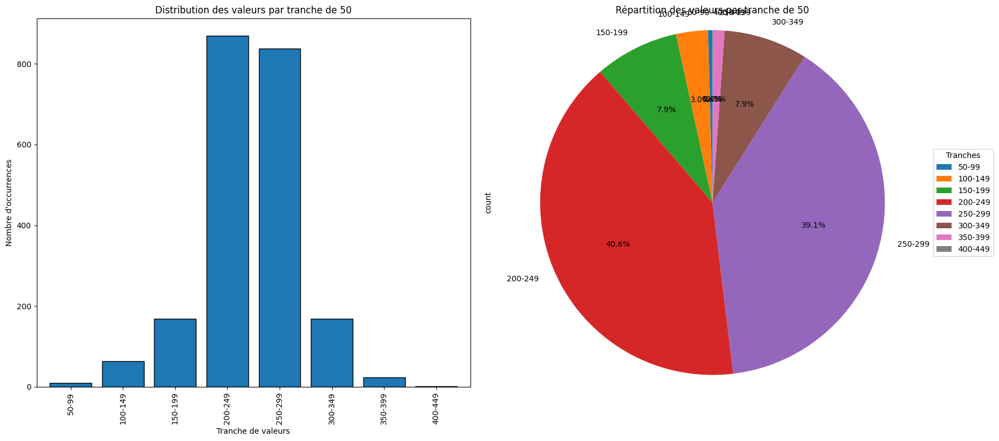

In [70]:
# Comptage du nombre d'occurrences dans chaque tranche
comptage_tranches_filtration = df_CRO_filtre_3_reinit['tranche'].value_counts(sort=False).sort_index()

# Création de la figure et des sous-graphiques
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(18, 8))

# Graphique à barres
comptage_tranches_filtration[comptage_tranches_filtration != 0].plot(kind='bar', edgecolor='black', width=0.8, ax=ax1)
ax1.set_xlabel('Tranche de valeurs')
ax1.set_ylabel('Nombre d\'occurrences')
ax1.set_title(f'Distribution des valeurs par tranche de {tranche}')

# Graphique camembert
comptage_tranches_filtration[comptage_tranches_filtration != 0].plot(kind='pie', autopct='%1.1f%%', startangle=90, ax=ax2)
ax2.axis('equal')  # Assure un camembert circulaire
ax2.set_title(f'Répartition des valeurs par tranche de {tranche}')
ax2.legend(comptage_tranches_filtration[comptage_tranches_filtration != 0].index, title='Tranches', loc='center left', bbox_to_anchor=(1, 0.5))

# Ajustements de la mise en page
plt.tight_layout()

# EDA test

In [71]:
df_CRO_test = df_CRO_all.query('organe == "foie"')
len(df_CRO_test)

229

## Nb d'occurence anatomopathologiste

In [72]:
print("nb d'anatomopathogiste en référénce:", len(meds) - 20)
nb_meds = df_CRO_test.id_med.unique()
print("nb d'anatomopathologiste qui apparaissent dans les CRO:", len(nb_meds))

nb d'anatomopathogiste en référénce: 80
nb d'anatomopathologiste qui apparaissent dans les CRO: 80


Text(0, 0.5, 'Occurence')

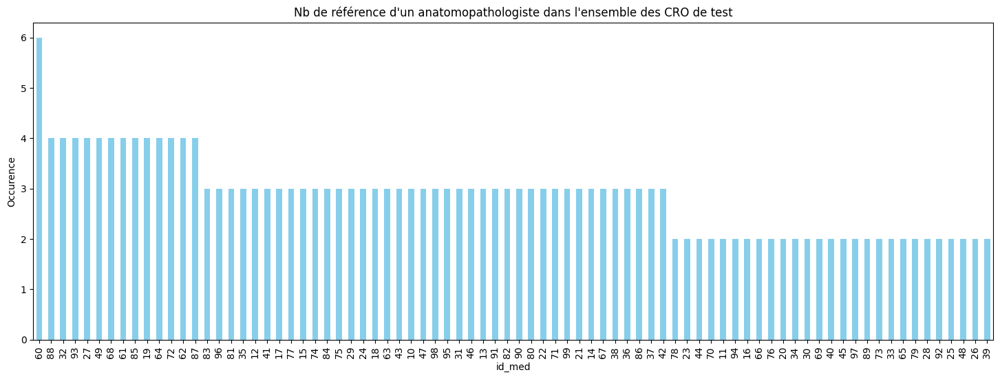

In [73]:
value_counts_med = df_CRO_test['id_med'].value_counts()

plt.figure(figsize=(18, 6))
value_counts_med.plot(kind='bar', color='skyblue')
plt.title("Nb de référence d'un anatomopathologiste dans l'ensemble des CRO de test")
plt.xlabel('id_med')
plt.ylabel('Occurence')

## Nb d'occurence d'un patient

In [74]:
print("nb de patient en référénce:", len(patients) -20)
nb_patients = df_CRO_test.nir.unique()
print("nb de patient qui apparaissent dans les CRO:", len(nb_patients))

nb de patient en référénce: 380
nb de patient qui apparaissent dans les CRO: 206


Text(0, 0.5, 'Occurence')

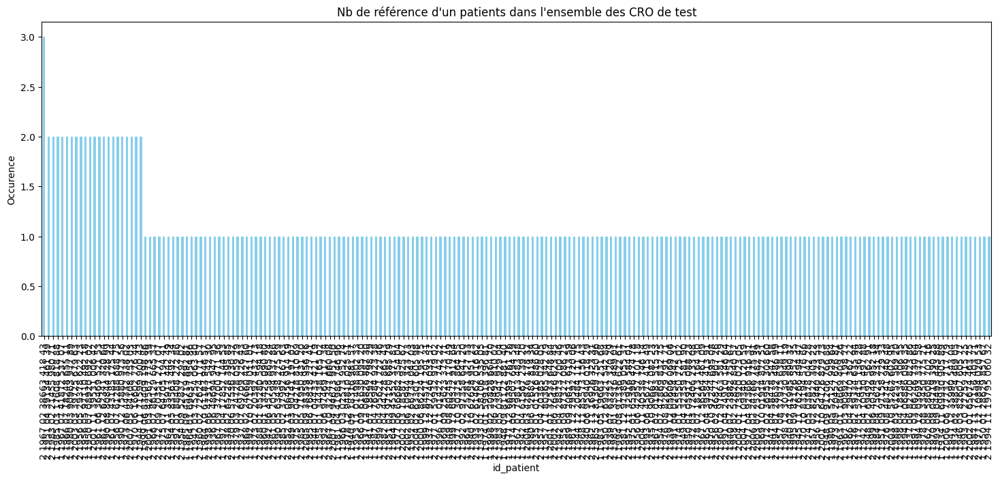

In [75]:
value_counts_patients = df_CRO_test['nir'].value_counts()

plt.figure(figsize=(18, 6))
value_counts_patients.plot(kind='bar', color='skyblue')
plt.title("Nb de référence d'un patients dans l'ensemble des CRO de test")
plt.xlabel('id_patient')
plt.ylabel('Occurence')

## Répartition des diagnostics

In [76]:
diags_train_valid = diagnostics.query('organe != "foie"')
print("nb de diagnostics en référence:", len(diags_train_valid))
nb_diags = df_CRO_test.id_diag.unique()
print("nb de diagnostics qui apparaissent dans les CRO:", len(nb_diags))

nb de diagnostics en référence: 20
nb de diagnostics qui apparaissent dans les CRO: 10


Text(0, 0.5, 'Occurence')

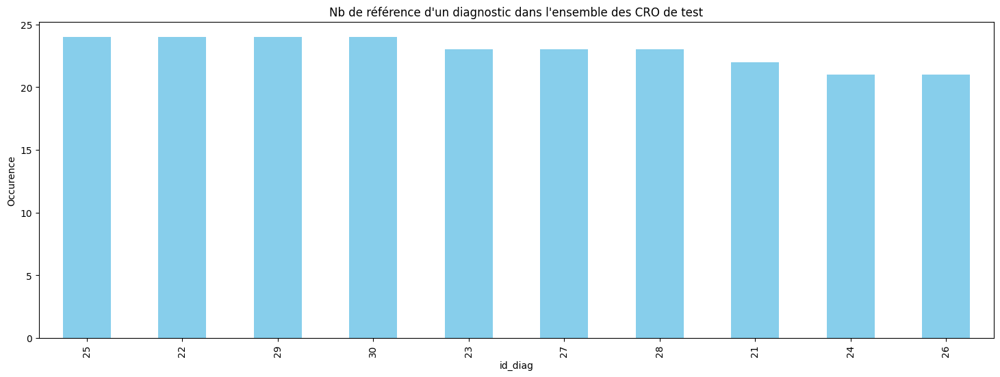

In [77]:
value_counts_diag = df_CRO_test['id_diag'].value_counts()

plt.figure(figsize=(18, 6))
value_counts_diag.plot(kind='bar', color='skyblue')
plt.title("Nb de référence d'un diagnostic dans l'ensemble des CRO de test")
plt.xlabel('id_diag')
plt.ylabel('Occurence')

# Langue et Qualité

## Langue

In [78]:
df_CRO_test_lang = df_CRO_test.copy(deep=True)

df_CRO_test_lang['language_proportions'] = df_CRO_test_lang.CRO.apply(detect_language_proportion)

In [79]:
df_CRO_test_lang.head(5)

,CRO,id_diag,id_med,nir,source,operation,name_patient,address,birthday,name_med,organe,diagnostic,cancer,language_proportions
209,Résumé anatomopathologique\nPatient : Auguste ...,23,88,1 1985 09 45719 892 81,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Auguste Lévêque,"88, rue de Pierre, 45719 Aubry",17/09/1985,Dr Louise Vallet,foie,hépatoblastome,1,"fr, 1.0"
210,Rés,27,81,2 1963 01 18669 409 26,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Frédérique Vaillant,"48, avenue Dias, 18669 Saint Charlottenec",20/01/1963,Dr Jacqueline Martin,foie,carcinome sarcomatoïde,1,"fr, 1.0"
211,"I'm sorry, it looks like the beginning of your...",25,14,2 1956 07 61288 688 75,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Inès Hervé,"rue Normand, 61288 Bigot",21/07/1956,Dr Denis Duhamel,foie,tumeur neuroendocrine,1,"en, 0.57/fr, 0.43"
212,Current Model\nmistralai/Mistral-7B-Instruct-v...,21,99,1 1990 12 75880 973 56,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Henri Diallo,"12, boulevard Jacob, 75880 Sainte Édith-sur-Mer",19/12/1990,Dr Lorraine Bonneau,foie,hémangiome,0,"ca, 1.0"
213,Current Model\nmistralai/Mistral-7B-Instruct-v...,24,64,2 1944 11 71599 900 43,mistralai/Mistral-7B-Instruct-v0.2,exérèse,Louise Mallet,"chemin Grondin, 71599 Lambert",21/11/1944,Dr Martine Normand,foie,cholangiocarcinome,1,"ca, 1.0"


In [80]:
nb_CRO_test_en = len(df_CRO_test_lang.query('language_proportions != "fr, 1.0"'))
print('nb de CRO dans une autre langue (complet ou partiel):', nb_CRO_test_en, 'soit', round(nb_CRO_test_en * 100 / len(df_CRO)), '% des CRO tests générés.')

nb de CRO dans une autre langue (complet ou partiel): 33 soit 1 % des CRO tests générés.


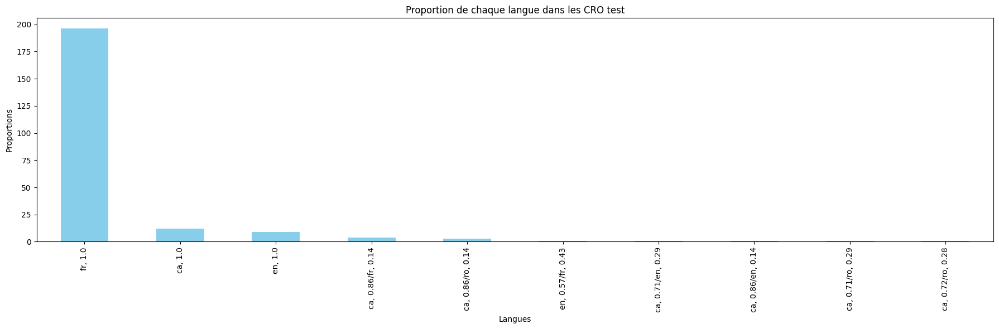

In [81]:
# Comptez les occurrences de chaque valeur dans la colonne
value_counts_lang_test = df_CRO_test_lang['language_proportions'].value_counts()

plt.figure(figsize=(18, 6))

# Créez un graphique en barres
value_counts_lang_test.plot(kind='bar', color='skyblue')
plt.title('Proportion de chaque langue dans les CRO test')
plt.xlabel('Langues')
plt.ylabel('Proportions')

plt.tight_layout()

In [82]:
CRO_test_non_fr = df_CRO_test_lang.query('language_proportions != "fr, 1.0"').reset_index()
for index in range(0, len(CRO_test_non_fr)):
    print(CRO_test_non_fr.CRO[index], '\n')

I'm sorry, it looks like the beginning of your question is missing some context. Could you please provide more information or complete the sentence so I can generate an appropriate response? Here are a few possibilities based on common phrases that include "génére":
Generate a list of French words starting with the letter "G" (générer une liste de mots français commençant par la lettre "G")
Generate a random number in French (générer un nombre aléatoire en français)
Generate a report in French (générer un rapport en français)
Generate excitement in French (générer de l'excitation en français)
If none of these options fit what you had in mind, please let me know and I will do my best to help! 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Résumé anatomopathologique
Patient : Luce Raynaud
Date de naissance : 23/05/2007
Adr

## Qualité

### Nb de mots dans les CRO

In [83]:
df_CRO_test_lang['nb_word'] = df_CRO_test_lang.CRO.apply(nb_word_in_text) 

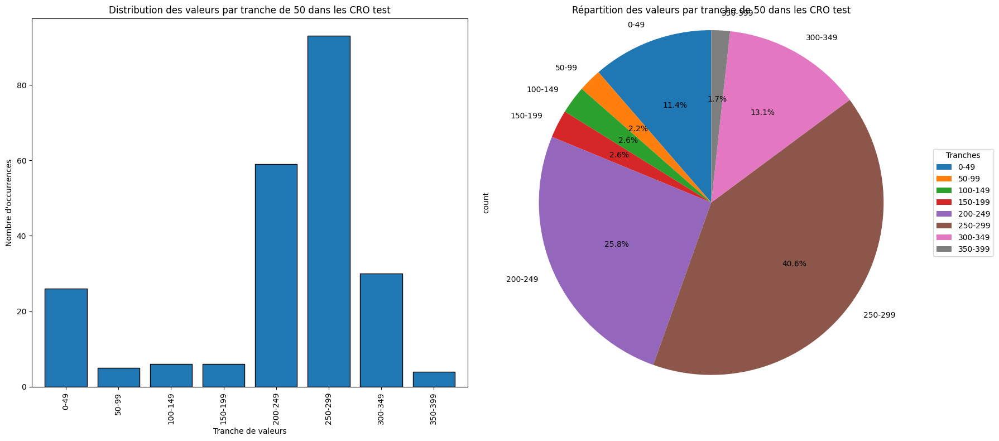

In [84]:
tranche = 50

# Créer des tranches
tranches_test = [(i, i + tranche - 1) for i in range(0, df_CRO_test_lang['nb_word'].max(), tranche)]

# Création de la colonne de tranche en utilisant la fonction pd.cut
df_CRO_test_lang['tranche'] = pd.cut(df_CRO_test_lang['nb_word'], bins=[i[0] for i in tranches_test] + [df_CRO_test_lang['nb_word'].max()], labels=[f"{i[0]}-{i[1]}" for i in tranches_test])

# Comptage du nombre d'occurrences dans chaque tranche
value_counts_tranches_test = df_CRO_test_lang['tranche'].value_counts(sort=False).sort_index()

# Création de la figure et des sous-graphiques
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(18, 8))

# Graphique à barres
value_counts_tranches_test[value_counts_tranches_test != 0].plot(kind='bar', edgecolor='black', width=0.8, ax=ax1)
ax1.set_xlabel('Tranche de valeurs')
ax1.set_ylabel('Nombre d\'occurrences')
ax1.set_title(f'Distribution des valeurs par tranche de {tranche} dans les CRO test')

# Graphique camembert
value_counts_tranches_test[value_counts_tranches_test != 0].plot(kind='pie', autopct='%1.1f%%', startangle=90, ax=ax2)
ax2.axis('equal')  # Assure un camembert circulaire
ax2.set_title(f'Répartition des valeurs par tranche de {tranche} dans les CRO test')
ax2.legend(value_counts_tranches_test[value_counts_tranches_test != 0].index, title='Tranches', loc='center left', bbox_to_anchor=(1, 0.5))

# Ajustements de la mise en page
plt.tight_layout()

In [85]:
CRO_test_tranche_query = df_CRO_test_lang.query('tranche == "300-349"').reset_index()
for index in range(0, len(CRO_test_tranche_query)):
    print(CRO_test_tranche_query.CRO[index], '\n')

Résumé anatomopathologique
Patient : Luce Raynaud
Date de naissance : 23/05/2007
Adresse : rue Denis Delmas, 84108 FontaineBourg
Numéro de sécurité sociale : 2 2007 05 84108 753 03
Description macroscopique :
Upon receipt of the specimen in the laboratory, its weight was recorded at 650 g. The liver measured 13 cm x 11 cm x 5 cm and appeared normal on gross examination with no visible lesions or abnormalities. However, upon careful dissection, a well-circumscribed nodular mass measuring approximately 3 cm in diameter was identified in segment IVb of the right lobe of the liver. The cut surface of the mass was dark red to purple, indicative of vascularity. No other lesions were noted.
Description microscopique :
Microscopic examination revealed a well-circumscribed tumor composed of numerous thin-walled blood vessels arranged in a capillary pattern (Figure 1). There was no evidence of necrosis, hemorrhage, or significant inflammation within the tumor. The tumor cells had a bland appeara

## CRO avec la note de fin 'Ceci est compte-rendu fictif'

In [86]:
df_CRO_test_lang['note_fin'] = df_CRO_test_lang.CRO.apply(CRO_note_valid)

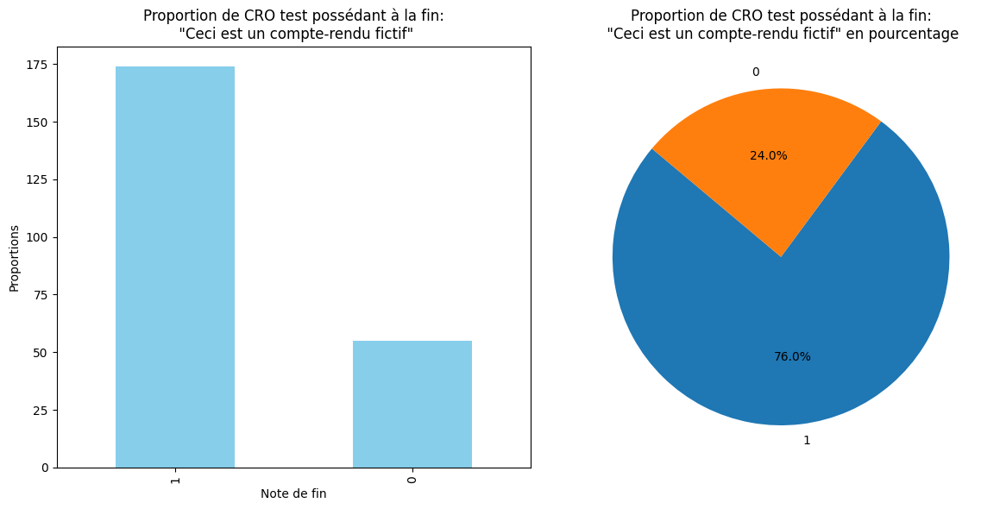

In [87]:
# Comptez les occurrences de chaque valeur dans la colonne
value_counts_note_fin_test = df_CRO_test_lang['note_fin'].value_counts()

# Créez un camembert
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
plt.pie(value_counts_note_fin_test, labels=value_counts_note_fin_test.index, autopct='%1.1f%%', startangle=140)
plt.title('Proportion de CRO test possédant à la fin:\n "Ceci est un compte-rendu fictif" en pourcentage')

# Créez un graphique en barres
plt.subplot(1, 2, 1)
value_counts_note_fin_test.plot(kind='bar', color='skyblue')
plt.title('Proportion de CRO test possédant à la fin:\n "Ceci est un compte-rendu fictif"')
plt.xlabel('Note de fin')
plt.ylabel('Proportions')

plt.tight_layout()

In [88]:
CRO_test_note_0 = df_CRO_test_lang.query('note_fin == 0').reset_index()
for i in range(0, len(CRO_test_note_0)):
    print(CRO_test_note_0.CRO[i], '\n')

Rés 

I'm sorry, it looks like the beginning of your question is missing some context. Could you please provide more information or complete the sentence so I can generate an appropriate response? Here are a few possibilities based on common phrases that include "génére":
Generate a list of French words starting with the letter "G" (générer une liste de mots français commençant par la lettre "G")
Generate a random number in French (générer un nombre aléatoire en français)
Generate a report in French (générer un rapport en français)
Generate excitement in French (générer de l'excitation en français)
If none of these options fit what you had in mind, please let me know and I will do my best to help! 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Résumé anatomopathologique
Patient : Mme Danielle Mallet
Date de naissance : 0

# Correspondance CRO et datas

## Ajout des colonnes vérifiants la présence des données dans les CRO

In [89]:
df_CRO_test_occurrence = df_CRO_test_lang.copy(deep=True)

df_CRO_test_occurrence['nb_diag'] = df_CRO_test_occurrence.apply(lambda row: trouver_occurrences(row['CRO'], row['diagnostic']), axis=1)
df_CRO_test_occurrence['diag_pr'] = df_CRO_test_occurrence['nb_diag'].apply(lambda x: 1 if x > 0 else 0)

df_CRO_test_occurrence['nb_med'] = df_CRO_test_occurrence.apply(lambda row: trouver_occurrences(row['CRO'], row['name_med']), axis=1)
df_CRO_test_occurrence['med_pr'] = df_CRO_test_occurrence['nb_med'].apply(lambda x: 1 if x > 0 else 0)

df_CRO_test_occurrence['nb_patient'] = df_CRO_test_occurrence.apply(lambda row: trouver_occurrences(row['CRO'], row['name_patient']), axis=1)
df_CRO_test_occurrence['patient_pr'] = df_CRO_test_occurrence['nb_patient'].apply(lambda x: 1 if x > 0 else 0)

df_CRO_test_occurrence['nb_birthday'] = df_CRO_test_occurrence.apply(lambda row: trouver_occurrences(row['CRO'], row['birthday']), axis=1)
df_CRO_test_occurrence['birthday_pr'] = df_CRO_test_occurrence['nb_birthday'].apply(lambda x: 1 if x > 0 else 0)

df_CRO_test_occurrence['nb_address'] = df_CRO_test_occurrence.apply(lambda row: trouver_occurrences(row['CRO'], row['address']), axis=1)
df_CRO_test_occurrence['address_pr'] = df_CRO_test_occurrence['nb_address'].apply(lambda x: 1 if x > 0 else 0)

df_CRO_test_occurrence['nb_nir'] = df_CRO_test_occurrence.apply(lambda row: trouver_occurrences(row['CRO'], row['nir']), axis=1)
df_CRO_test_occurrence['nir_pr'] = df_CRO_test_occurrence['nb_nir'].apply(lambda x: 1 if x > 0 else 0)

df_CRO_test_occurrence['note'] = df_CRO_test_occurrence['diag_pr'] + df_CRO_test_occurrence['med_pr'] + df_CRO_test_occurrence['patient_pr'] + df_CRO_test_occurrence['birthday_pr']\
    + df_CRO_test_occurrence['address_pr'] + df_CRO_test_occurrence['nir_pr']

## La présence des diagnostics dans les CRO test

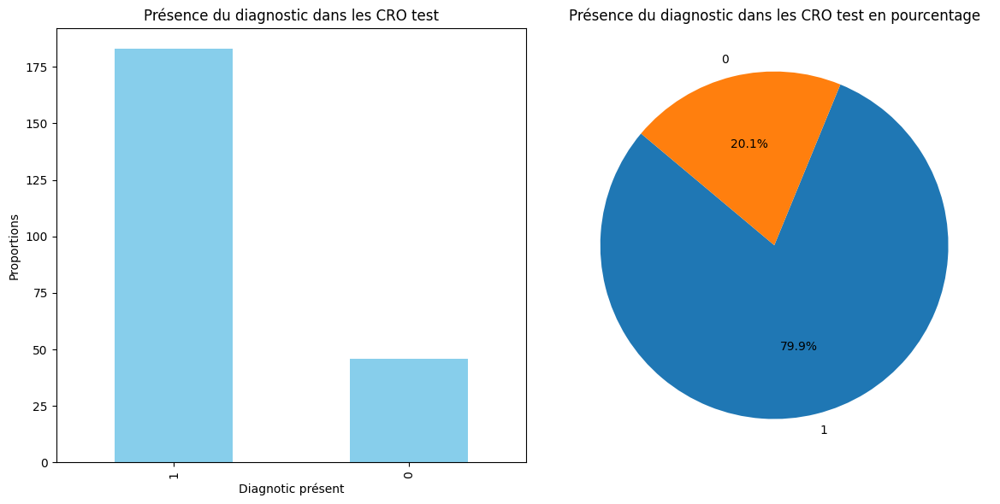

In [90]:
# Présence des diagnostics dans les CRO
value_counts_diag_nb_test = df_CRO_test_occurrence['diag_pr'].value_counts()

# Créez un camembert
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
plt.pie(value_counts_diag_nb_test, labels=value_counts_diag_nb_test.index, autopct='%1.1f%%', startangle=140)
plt.title('Présence du diagnostic dans les CRO test en pourcentage')

# Créez un graphique en barres
plt.subplot(1, 2, 1)
value_counts_diag_nb_test.plot(kind='bar', color='skyblue')
plt.title('Présence du diagnostic dans les CRO test')
plt.xlabel('Diagnotic présent')
plt.ylabel('Proportions')

plt.tight_layout()

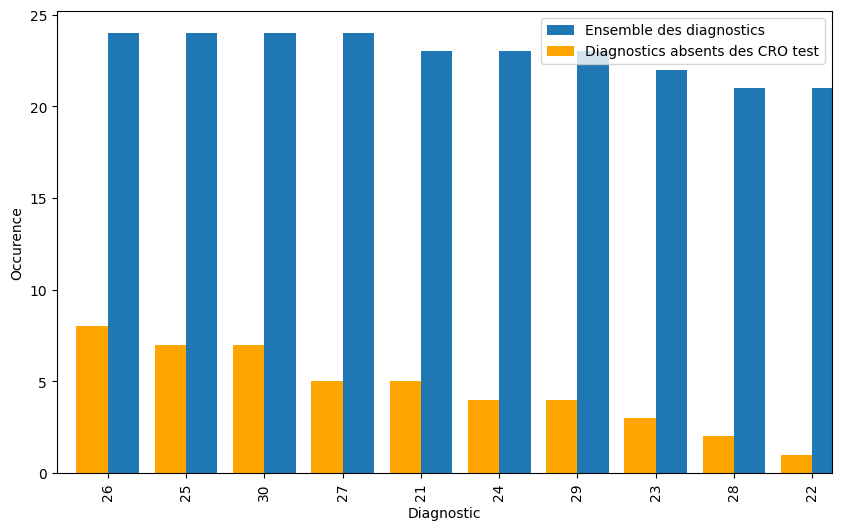

In [91]:
# détermination des diagnostics absents des CRO

diagnostics_absent_test = df_CRO_test_occurrence.query('diag_pr == 0')

# Initialisez le graphique
fig, ax = plt.subplots(figsize=(10, 6))

# Graphique de l'ensemble du DataFrame
df_CRO_test['id_diag'].value_counts().plot(kind='bar', ax=ax, position=0, width=0.4, label='Ensemble des diagnostics')

# Graphique du sous-ensemble filtré
diagnostics_absent_test['id_diag'].value_counts().plot(kind='bar', ax=ax, position=1, width=0.4, color='orange', label='Diagnostics absents des CRO test')
ax.set_xlabel('Diagnostic')
ax.set_ylabel('Occurence')
ax.legend()

In [92]:
diag = 22
query = f'(id_diag == {diag}) and (diag_pr == 0)'
sans_diag_test = df_CRO_test_occurrence.query(query).index
print(sans_diag_test)

for index in sans_diag_test:
    CRO_test_sans_diag = df_CRO_test_occurrence.query(query).CRO[index]
    print(CRO_test_sans_diag, '\n')

Index([228], dtype='int64')
Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 



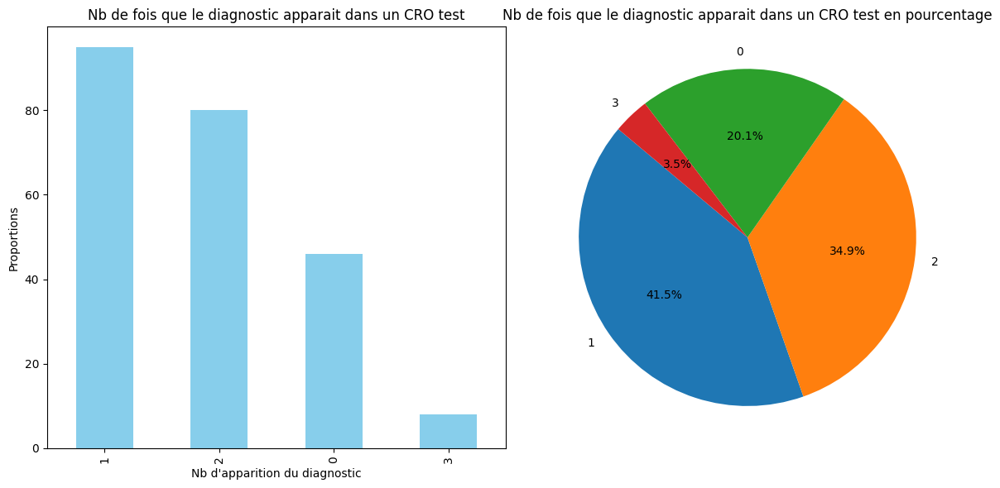

In [93]:
# Comptez les occurrences de chaque valeur dans la colonne
value_counts_diag_occ_test = df_CRO_test_occurrence['nb_diag'].value_counts()

# Créez un camembert
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
plt.pie(value_counts_diag_occ_test, labels=value_counts_diag_occ_test.index, autopct='%1.1f%%', startangle=140)
plt.title("Nb de fois que le diagnostic apparait dans un CRO test en pourcentage")

# Créez un graphique en barres
plt.subplot(1, 2, 1)
value_counts_diag_occ_test.plot(kind='bar', color='skyblue')
plt.title("Nb de fois que le diagnostic apparait dans un CRO test")
plt.xlabel("Nb d'apparition du diagnostic")
plt.ylabel('Proportions')

plt.tight_layout()

In [94]:
CRO_occ_test_query = df_CRO_test_occurrence.query('nb_diag == 4').reset_index()
for index in range(0, len(CRO_occ_test_query)):
    print(CRO_occ_test_query.CRO[index], '\n')

## La présence de l'anatomopathologiste dans le CRO test

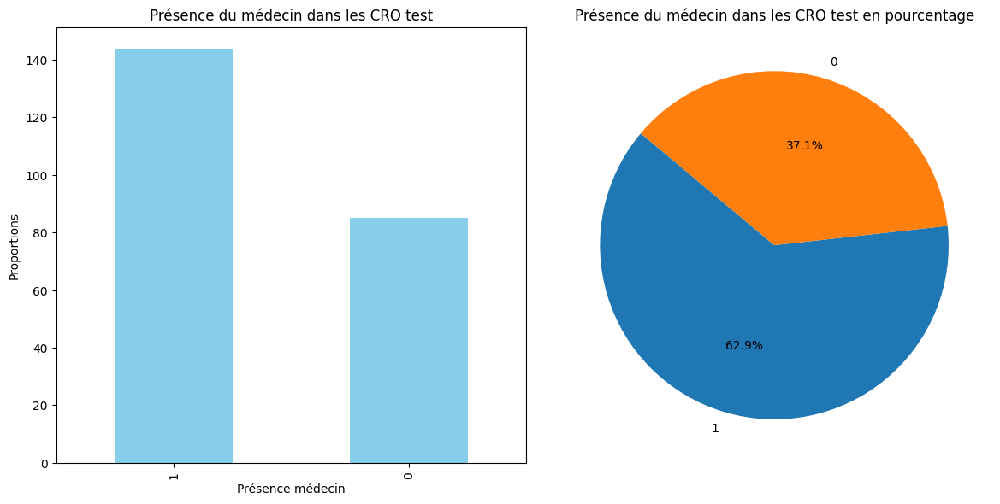

In [95]:
# Comptez les occurrences de chaque valeur dans la colonne
value_counts_med_pr_test = df_CRO_test_occurrence['med_pr'].value_counts()

# Créez un camembert
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
plt.pie(value_counts_med_pr_test, labels=value_counts_med_pr_test.index, autopct='%1.1f%%', startangle=140)
plt.title('Présence du médecin dans les CRO test en pourcentage')

# Créez un graphique en barres
plt.subplot(1, 2, 1)
value_counts_med_pr_test.plot(kind='bar', color='skyblue')
plt.title('Présence du médecin dans les CRO test')
plt.xlabel('Présence médecin')
plt.ylabel('Proportions')

plt.tight_layout()

In [96]:
index_sans_med_test = df_CRO_test_occurrence.query('med_pr == 0').index
for index in index_sans_med_test:
    print('médecin', df_CRO_test_occurrence.name_med[index], index)
    print(df_CRO_test_occurrence.CRO[index], '\n')

médecin Dr Jacqueline Martin 210
Rés 

médecin Dr Denis Duhamel 211
I'm sorry, it looks like the beginning of your question is missing some context. Could you please provide more information or complete the sentence so I can generate an appropriate response? Here are a few possibilities based on common phrases that include "génére":
Generate a list of French words starting with the letter "G" (générer une liste de mots français commençant par la lettre "G")
Generate a random number in French (générer un nombre aléatoire en français)
Generate a report in French (générer un rapport en français)
Generate excitement in French (générer de l'excitation en français)
If none of these options fit what you had in mind, please let me know and I will do my best to help! 

médecin Dr Lorraine Bonneau 212
Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

médecin Dr Martine Normand 213
Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

médecin Dr Christiane Pe

## La présence du patient dans le CRO test

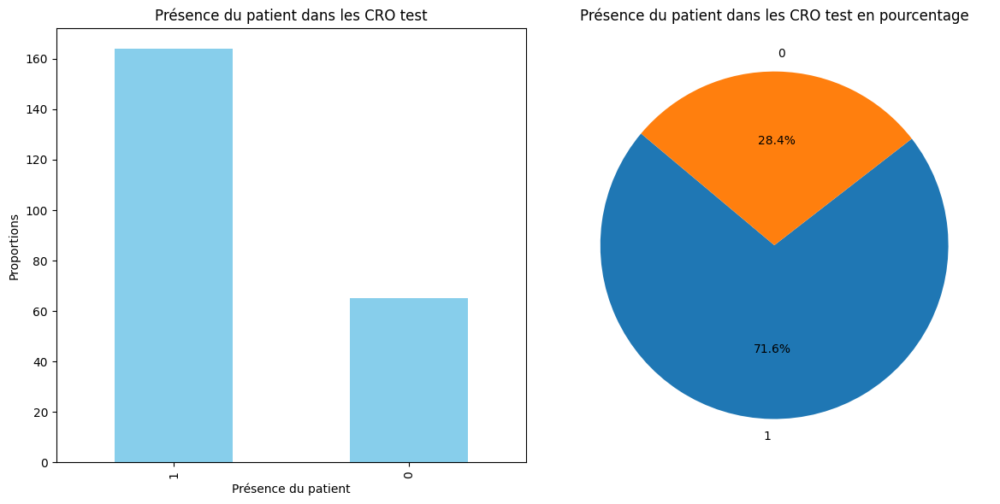

In [97]:
# Comptez les occurrences de chaque valeur dans la colonne
value_counts_patient_pr_test = df_CRO_test_occurrence['patient_pr'].value_counts()

# Créez un camembert
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
plt.pie(value_counts_patient_pr_test, labels=value_counts_patient_pr_test.index, autopct='%1.1f%%', startangle=140)
plt.title('Présence du patient dans les CRO test en pourcentage')

# Créez un graphique en barres
plt.subplot(1, 2, 1)
value_counts_patient_pr_test.plot(kind='bar', color='skyblue')
plt.title('Présence du patient dans les CRO test')
plt.xlabel('Présence du patient')
plt.ylabel('Proportions')

plt.tight_layout()

In [98]:
index_CRO_sans_patient_test = df_CRO_test_occurrence.query('patient_pr == 0').index
for index in index_CRO_sans_patient_test:
    print(index)
    print(df_CRO_test_occurrence.CRO[index], '\n')

210
Rés 

211
I'm sorry, it looks like the beginning of your question is missing some context. Could you please provide more information or complete the sentence so I can generate an appropriate response? Here are a few possibilities based on common phrases that include "génére":
Generate a list of French words starting with the letter "G" (générer une liste de mots français commençant par la lettre "G")
Generate a random number in French (générer un nombre aléatoire en français)
Generate a report in French (générer un rapport en français)
Generate excitement in French (générer de l'excitation en français)
If none of these options fit what you had in mind, please let me know and I will do my best to help! 

212
Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

213
Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

215
Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

226
Titre : Biopsie Lymphienne : Résultats Histologiques
R

## La présence de la date de naissance dans les CRO test

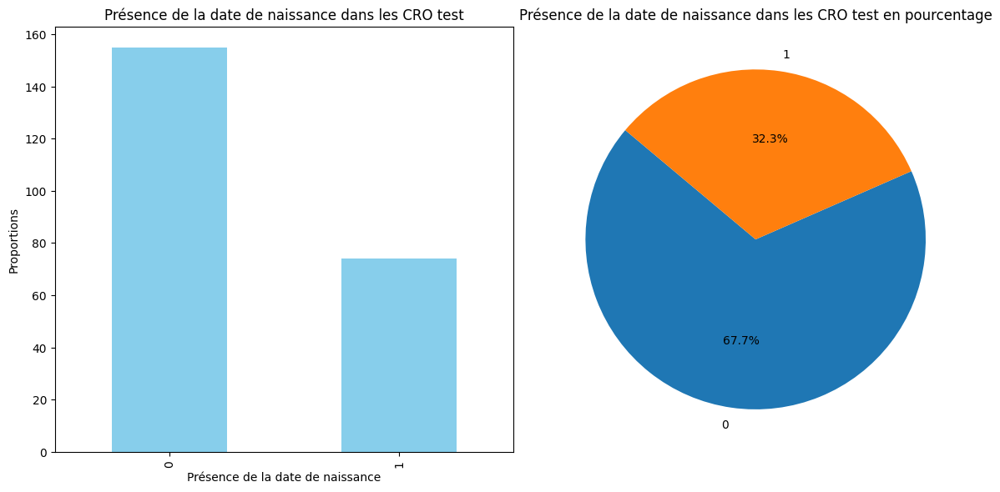

In [99]:
# Comptez les occurrences de chaque valeur dans la colonne
value_counts_date_pr_test = df_CRO_test_occurrence['birthday_pr'].value_counts()

# Créez un camembert
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
plt.pie(value_counts_date_pr_test, labels=value_counts_date_pr_test.index, autopct='%1.1f%%', startangle=140)
plt.title('Présence de la date de naissance dans les CRO test en pourcentage')

# Créez un graphique en barres
plt.subplot(1, 2, 1)
value_counts_date_pr_test.plot(kind='bar', color='skyblue')
plt.title('Présence de la date de naissance dans les CRO test')
plt.xlabel('Présence de la date de naissance')
plt.ylabel('Proportions')

plt.tight_layout()

In [100]:
index_CRO_sans_date_test = df_CRO_test_occurrence.query('birthday_pr == 0').index
for index in index_CRO_sans_date_test:
    print(index)
    print(df_CRO_test_occurrence.CRO[index], '\n')

210
Rés 

211
I'm sorry, it looks like the beginning of your question is missing some context. Could you please provide more information or complete the sentence so I can generate an appropriate response? Here are a few possibilities based on common phrases that include "génére":
Generate a list of French words starting with the letter "G" (générer une liste de mots français commençant par la lettre "G")
Generate a random number in French (générer un nombre aléatoire en français)
Generate a report in French (générer un rapport en français)
Generate excitement in French (générer de l'excitation en français)
If none of these options fit what you had in mind, please let me know and I will do my best to help! 

212
Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

213
Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

215
Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

226
Titre : Biopsie Lymphienne : Résultats Histologiques
R

## La présence de l'adresse du patient dans les CRO test

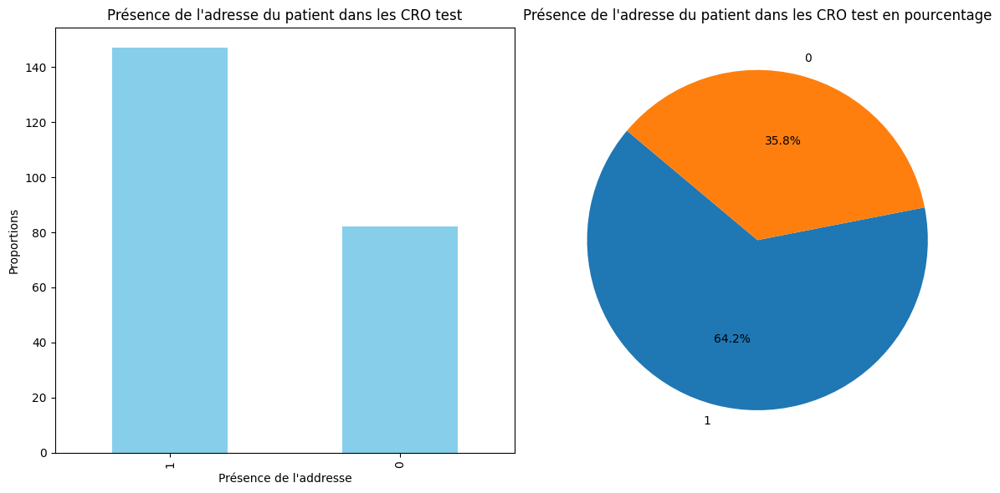

In [101]:
# Comptez les occurrences de chaque valeur dans la colonne
value_counts_address_pr_test = df_CRO_test_occurrence['address_pr'].value_counts()

# Créez un camembert
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
plt.pie(value_counts_address_pr_test, labels=value_counts_address_pr_test.index, autopct='%1.1f%%', startangle=140)
plt.title("Présence de l'adresse du patient dans les CRO test en pourcentage")

# Créez un graphique en barres
plt.subplot(1, 2, 1)
value_counts_address_pr_test.plot(kind='bar', color='skyblue')
plt.title("Présence de l'adresse du patient dans les CRO test")
plt.xlabel("Présence de l'addresse")
plt.ylabel('Proportions')

plt.tight_layout()

In [102]:
index_CRO_sans_address_test = df_CRO_test_occurrence.query('address_pr == 0').index
for index in index_CRO_sans_address_test:
    print(index)
    print(df_CRO_test_occurrence.CRO[index], '\n')

210
Rés 

211
I'm sorry, it looks like the beginning of your question is missing some context. Could you please provide more information or complete the sentence so I can generate an appropriate response? Here are a few possibilities based on common phrases that include "génére":
Generate a list of French words starting with the letter "G" (générer une liste de mots français commençant par la lettre "G")
Generate a random number in French (générer un nombre aléatoire en français)
Generate a report in French (générer un rapport en français)
Generate excitement in French (générer de l'excitation en français)
If none of these options fit what you had in mind, please let me know and I will do my best to help! 

212
Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

213
Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

215
Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

226
Titre : Biopsie Lymphienne : Résultats Histologiques
R

## Note finale dans les CRO test

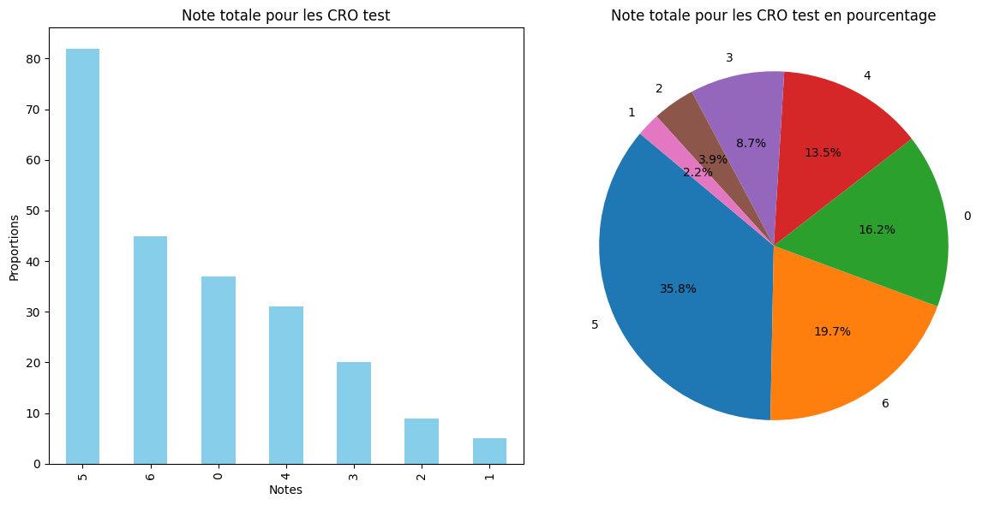

In [103]:
# Comptez les occurrences de chaque valeur dans la colonne
value_counts_note_test = df_CRO_test_occurrence['note'].value_counts()

# Créez un camembert
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
plt.pie(value_counts_note_test, labels=value_counts_note_test.index, autopct='%1.1f%%', startangle=140)
plt.title("Note totale pour les CRO test en pourcentage")

# Créez un graphique en barres
plt.subplot(1, 2, 1)
value_counts_note_test.plot(kind='bar', color='skyblue')
plt.title("Note totale pour les CRO test")
plt.xlabel('Notes')
plt.ylabel('Proportions')

plt.tight_layout()

# CRO test valides

### La langue

In [104]:
df_CRO_test_filtre_1 = df_CRO_test_occurrence.query('language_proportions == "fr, 1.0"')
print('Taille originale du df CRO:', len(df_CRO_test_occurrence), 'CRO test,')
print('taille après filtrage de la langue (fr 100%):', len(df_CRO_test_filtre_1), 'CRO test,')
print('soit une perte de', round((len(df_CRO_test_occurrence) - len(df_CRO_test_filtre_1)) * 100 / len(df_CRO_test_occurrence), 2), '%.')

Taille originale du df CRO: 229 CRO test,
taille après filtrage de la langue (fr 100%): 196 CRO test,
soit une perte de 14.41 %.


### La présence de toutes les données

In [105]:
df_CRO_test_filtre_2 = df_CRO_test_filtre_1.query('diag_pr == 1')
print('Taille après filtrage de la note (6/6):', len(df_CRO_test_filtre_2), 'CRO test,')
print('soit une perte de', round((len(df_CRO_test_occurrence) - len(df_CRO_test_filtre_2)) * 100 / len(df_CRO_test_occurrence), 2), '% par rapport au df test sans filtre.')

Taille après filtrage de la note (6/6): 182 CRO test,
soit une perte de 20.52 % par rapport au df test sans filtre.


### La présence de la note de fin

In [106]:
df_CRO_test_filtre_3 = df_CRO_test_filtre_2.query('note_fin == 1')
print('Taille après filtrage de la présence de la note de fin:', len(df_CRO_test_filtre_3), 'CRO test,')
print('soit une perte de', round((len(df_CRO_test_occurrence) - len(df_CRO_test_filtre_3)) * 100 / len(df_CRO_test_occurrence), 2), '% par rapport au df test sans filtre.')

Taille après filtrage de la présence de la note de fin: 173 CRO test,
soit une perte de 24.45 % par rapport au df test sans filtre.


In [107]:
df_CRO_test_filtre_3_reinit = df_CRO_test_filtre_3.reset_index(drop=True)
for index in range(0, len(df_CRO_test_filtre_3_reinit) -1):
    print(df_CRO_test_filtre_3_reinit.CRO[index], '\n')

Résumé anatomopathologique
Patient : Auguste Lévêque
Date de naissance : 17/09/1985
Adresse : 88, rue de Pierre, 45719 Aubry
Numéro de sécurité social : 1 1985 09 45719 892 81
Rappels personnels :
L'examen histopathologique a été réalisé sur un échantillon de tissu provenant d'une biopsie hépatique effectuée chez M Auguste Lévêque.
Description macrogastrinométrique :
Le prélèvement présentait une apparence grossièrement homogène, sans signes évidents de nécrose ou d'hémorragie. La coupe transversale montrait une texture pâle et fibreuse, avec des zones friable et hétérogène. Aucun nodule distinct ne était visible à l'œil nu.
Description microscopique :
À l'examen microscopique, le tissu hépatocellulaire présente une architecture disorganisée avec des cellules hépatiques en grande proportion irrégulierment dispersées dans un stroma myxoïde. Des cellules rhabdoides grandes et polymorphes sont observées, avec des noyaux hyperchromatiques et des mitoses atypiques abondants. Les cellules rh

# EDA test après filtration

## Le type de prélèvement (après filtrage)

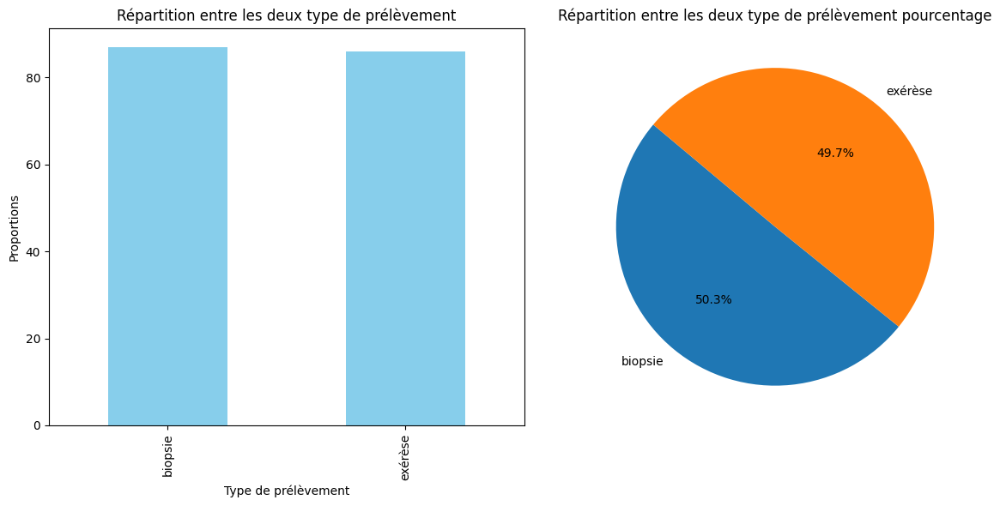

In [108]:
# Comptez les occurrences de chaque valeur dans la colonne
value_counts_test = df_CRO_test_filtre_3_reinit['operation'].value_counts()

# Créez un camembert
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
plt.pie(value_counts_test, labels=value_counts_test.index, autopct='%1.1f%%', startangle=140)
plt.title("Répartition entre les deux type de prélèvement pourcentage")

# Créez un graphique en barres
plt.subplot(1, 2, 1)
value_counts_test.plot(kind='bar', color='skyblue')
plt.title("Répartition entre les deux type de prélèvement")
plt.xlabel('Type de prélèvement')
plt.ylabel('Proportions')

plt.tight_layout()

## Les anatomopathologistes (après filtration)

Text(0, 0.5, 'Occurence')

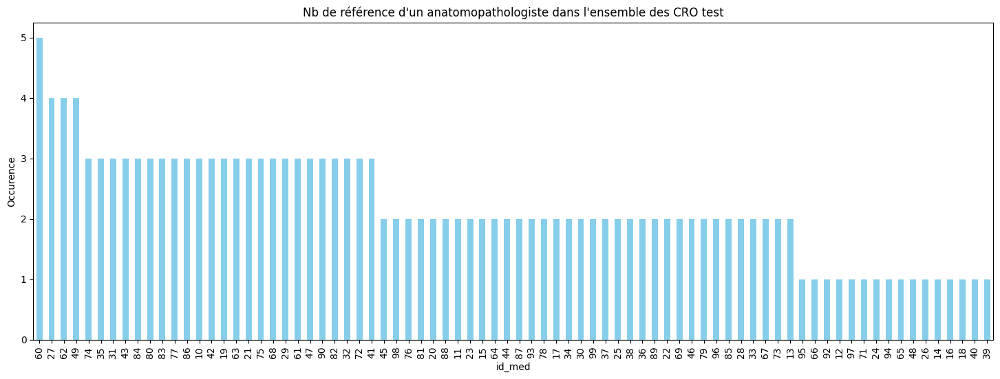

In [109]:
value_counts_test = df_CRO_test_filtre_3_reinit['id_med'].value_counts()

plt.figure(figsize=(18, 6))
value_counts_test.plot(kind='bar', color='skyblue')
plt.title("Nb de référence d'un anatomopathologiste dans l'ensemble des CRO test")
plt.xlabel('id_med')
plt.ylabel('Occurence')

## Les patients (après filtration)

Text(0, 0.5, 'Occurence')

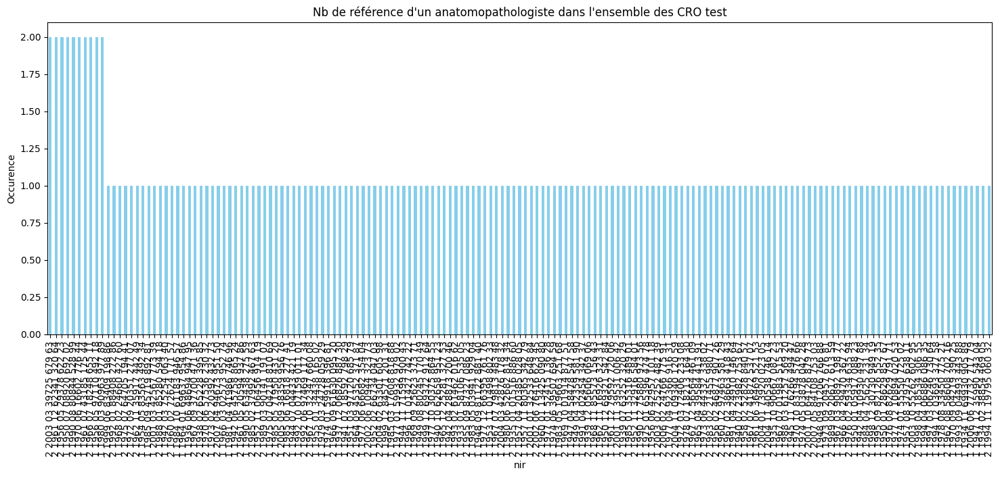

In [110]:
value_counts_test = df_CRO_test_filtre_3_reinit['nir'].value_counts()

plt.figure(figsize=(18, 6))
value_counts_test.plot(kind='bar', color='skyblue')
plt.title("Nb de référence d'un anatomopathologiste dans l'ensemble des CRO test")
plt.xlabel('nir')
plt.ylabel('Occurence')

## Les diagnostics (après filtration)

In [111]:
diags_test = diagnostics.query('organe == "foie"')
print("nb de diagnostics en référence:", len(diags_test))
nb_diags_test = df_CRO_test_filtre_3_reinit.id_diag.unique()
print("nb de diagnostics qui apparaissent dans les CRO test:", len(nb_diags_test))

nb de diagnostics en référence: 10
nb de diagnostics qui apparaissent dans les CRO test: 10


Text(0, 0.5, 'Occurence')

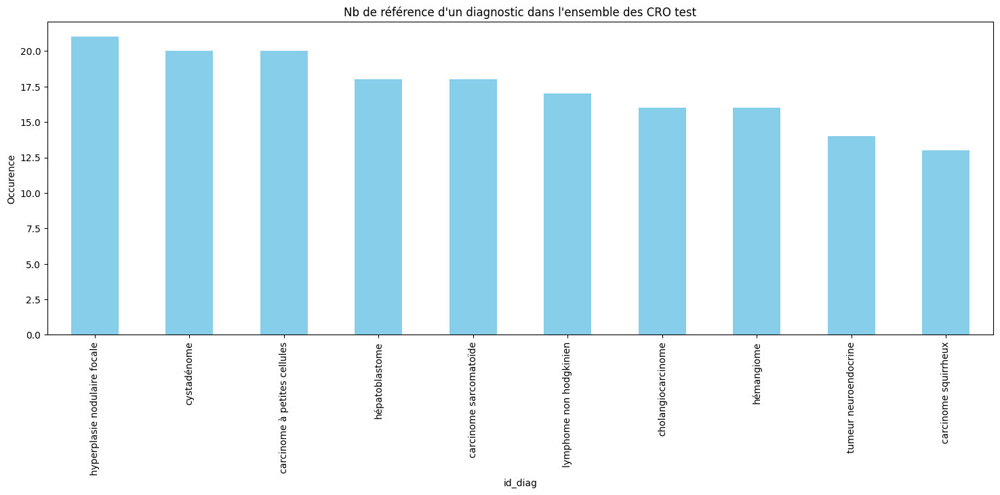

In [112]:
value_counts_test = df_CRO_test_filtre_3_reinit['diagnostic'].value_counts()

plt.figure(figsize=(18, 6))
value_counts_test.plot(kind='bar', color='skyblue')
plt.title("Nb de référence d'un diagnostic dans l'ensemble des CRO test")
plt.xlabel('id_diag')
plt.ylabel('Occurence')

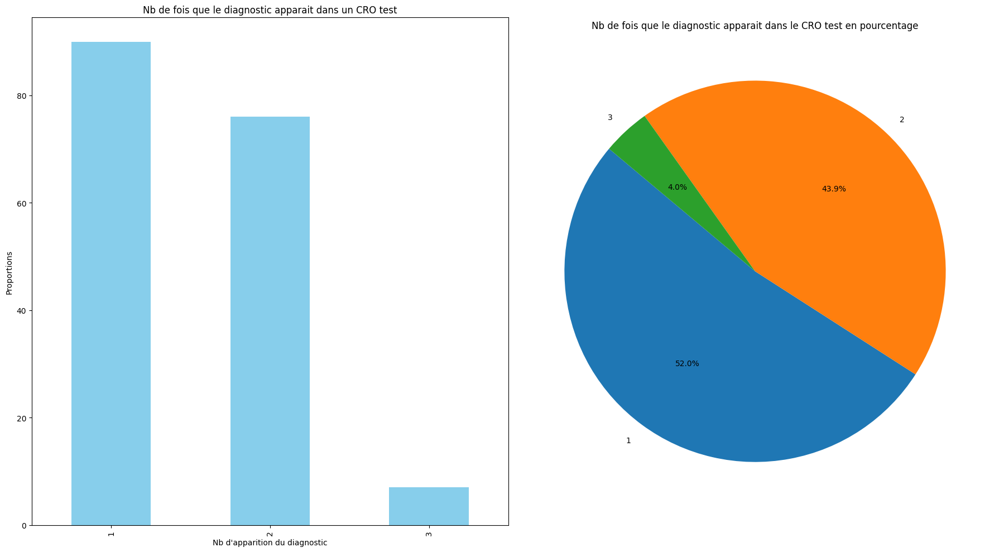

In [113]:
# Comptez les occurrences de chaque valeur dans la colonne
value_counts_test = df_CRO_test_filtre_3_reinit['nb_diag'].value_counts()

# Créez un camembert
plt.figure(figsize=(18, 10))
plt.subplot(1, 2, 2)
plt.pie(value_counts_test, labels=value_counts_test.index, autopct='%1.1f%%', startangle=140)
plt.title("Nb de fois que le diagnostic apparait dans le CRO test en pourcentage")

# Créez un graphique en barres
plt.subplot(1, 2, 1)
value_counts_test.plot(kind='bar', color='skyblue')
plt.title("Nb de fois que le diagnostic apparait dans un CRO test")
plt.xlabel("Nb d'apparition du diagnostic")
plt.ylabel('Proportions')

plt.tight_layout()

## Répartition par nb de mots (après filtration)

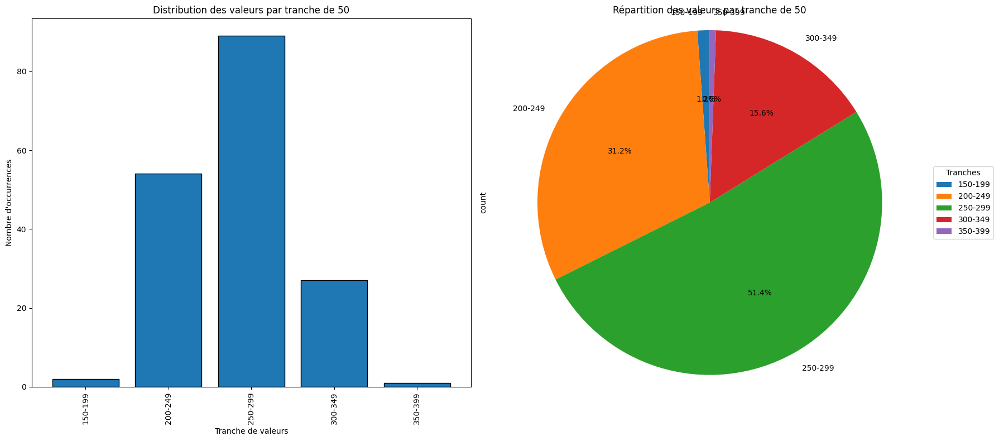

In [114]:
# Comptage du nombre d'occurrences dans chaque tranche
comptage_tranches_filtration_test = df_CRO_test_filtre_3_reinit['tranche'].value_counts(sort=False).sort_index()

# Création de la figure et des sous-graphiques
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(18, 8))

# Graphique à barres
comptage_tranches_filtration_test[comptage_tranches_filtration_test != 0].plot(kind='bar', edgecolor='black', width=0.8, ax=ax1)
ax1.set_xlabel('Tranche de valeurs')
ax1.set_ylabel('Nombre d\'occurrences')
ax1.set_title(f'Distribution des valeurs par tranche de {tranche}')

# Graphique camembert
comptage_tranches_filtration_test[comptage_tranches_filtration_test != 0].plot(kind='pie', autopct='%1.1f%%', startangle=90, ax=ax2)
ax2.axis('equal')  # Assure un camembert circulaire
ax2.set_title(f'Répartition des valeurs par tranche de {tranche}')
ax2.legend(comptage_tranches_filtration_test[comptage_tranches_filtration_test != 0].index, title='Tranches', loc='center left', bbox_to_anchor=(1, 0.5))

# Ajustements de la mise en page
plt.tight_layout()

# Enregistrement du dataframe CRO filtré

In [115]:
from sqlalchemy import create_engine
import os

def send_to_SQL(db_table, df):
    # Paramètres de connexion à la base de données MySQL
    db_username = os.getenv('DB_USER')
    db_password = os.getenv('DB_PASSWORD')
    db_host = os.getenv('DB_HOST')
    db_port = os.getenv('DB_PORT')
    db_database = os.getenv('DB_DATABASE')

    # Créer une connexion à la base de données MySQL avec SQLAlchemy
    engine = create_engine(f"mysql+pymysql://{db_username}:{db_password}@{db_host}:{db_port}/{db_database}")

    # # Envoyer le DataFrame en tant que table MySQL
    df.to_sql(name=db_table, con=engine, index=False, if_exists='replace')

    # Récupérer les données de la table MySQL
    query = f"SELECT * FROM {db_table}"
    df_from_mysql = pd.read_sql(query, con=engine)

    # Afficher le DataFrame récupéré depuis MySQL
    print("DataFrame récupéré depuis MySQL:")
    print(df_from_mysql)

In [116]:
df_CRO_all_filtre_3 = pd.concat([df_CRO_filtre_3_reinit, df_CRO_test_filtre_3_reinit], ignore_index=True)

In [117]:
# df_CRO_all_filtre_3.to_csv(f'{file}\df_CRO_filter.csv', index=False, sep=';')

In [118]:
send_to_SQL('CRO', df_CRO_all_filtre_3[['CRO', 'id_diag', 'id_med', 'nir', 'source', 'operation']])

DataFrame récupéré depuis MySQL:
                                                    CRO  id_diag  id_med  \
0     Résumé anatomo-pathologique\nPatient : Thomas ...        5      59   
1     Résumé anatomopathologique\nPatient : Susan Ré...       20       8   
2     Résumé anatomo-pathologique\nPatient : M Bertr...       12       4   
3     Résumé anatomopathologique\nPatient : Mme Virg...        4       1   
4     Résumé anatomopathologique\nPatient : M Benjam...        6      55   
...                                                 ...      ...     ...   
2308  Résumé anatomico-pathologique pour la résectio...       28      93   
2309  Résumé anatomopathologique\nPatient : M Paul L...       26      39   
2310  Résumé anatomopathologique\nPatient : Olivier ...       26      42   
2311  Résumé opératoire d'Histopathologie :\nPatient...       24      21   
2312  Résumé anatomopathologique\nPatient : Mme Deni...       21      19   

                         nir                          